# 0.Introduction

## 0.1 Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
from pandas import DataFrame
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
import warnings
from sklearn import linear_model
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import SimpleImputer
from sklearn.model_selection import KFold
from keras.utils.vis_utils import plot_model
from tensorflow import keras
from sklearn.svm import SVR
import datetime
import seaborn as sns
from os import listdir
from os.path import isfile, join
from sklearn.preprocessing import StandardScaler, MinMaxScaler,FunctionTransformer, PowerTransformer, QuantileTransformer, RobustScaler
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from tensorflow.keras import activations
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer
from IPython.display import display_html 
from re import VERBOSE
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn import set_config
from sklearn.compose import ColumnTransformer
from pyparsing.helpers import disable_diag
from scipy.stats.mstats import winsorize

warnings.filterwarnings("ignore", category= RuntimeWarning)
warnings.filterwarnings("ignore", category= FutureWarning)
set_config(display="diagram")

## 0.2 Variables

In [ ]:
#dataframe to save various results
results_mse = pd.DataFrame(columns=['modelName', 'train_mse', 'test_mse', 'difference'])
results_mae = pd.DataFrame(columns=['modelName', 'train_mae', 'test_mae', 'difference'])
results_r2score = pd.DataFrame(columns=['modelName', 'train_r2score', 'test_r2score', 'difference'])
results_evs = pd.DataFrame(columns=['modelName', 'train_evs', 'test_evs', 'difference'])

## 0.3 Functions

### -data preparation

In [ ]:
#checks missing data in %-tage in given dataset
def checkDataForNulls (dataset):
    percent_missing = dataset.isnull().sum() * 100 / len(dataset)
    missing_value_df = pd.DataFrame({'Column': dataset.columns,
                                 'percent_missing': percent_missing})
    print(missing_value_df)

In [ ]:
#show boxplot for dataset befroe modifications and after
def boxplot_compare_dist(df, y_before, y_after):
    f = plt.figure(figsize=(16,8))
    st = f.suptitle(f"{y_before} comparison", fontsize="x-large")
    ax1=plt.subplot(2,2,1)
    a = sns.distplot(df[y_before])
    plt.subplot(2,2,3)
    sns.boxplot(y=y_before, data = df)
    ax2=plt.subplot(2,2,2)
    b = sns.distplot(df [y_after])
    plt.subplot(2,2,4)
    sns.boxplot(y=y_after, data = df)
    a.title.set_text('before')
    b.title.set_text('after')
    plt.show()

In [ ]:
#transform specific column with requested tranfromer
def transform (transf, X_train, X_test, name, col):
  #train
  X_train_df = pd.DataFrame(X_train, columns = ['AT','V', 'AP', "RH"])
  X_train_df = X_train_df.drop(['AT','V'], axis=1)
  data_trans = transf.fit_transform(X_train_df) 
  data_trans_df = pd.DataFrame(data_trans, columns = ['AP', "RH"])

  #test
  X_test_df = pd.DataFrame(X_test, columns = ['AT','V', 'AP', "RH"])
  X_test_df = X_test_df.drop(['AT','V'], axis=1)
  data_trans_test = transf.transform(X_test_df)
  data_trans_test_df = pd.DataFrame(data_trans_test, columns = ['AP', "RH"])

  #show results
  compare_to_normal (X_train_df,data_trans_df, col, f'{name}_Train')
  compare_to_normal (X_test_df,data_trans_test_df, col, f'{name}_Test')
  return data_trans, data_trans_test

In [ ]:
#iterate over list of transformers and check specific column
def transform_list(X_train, X_test, col):
    rcpr_transformer = FunctionTransformer(lambda x: 1/x, validate = True)
    sqr_transformer = FunctionTransformer(lambda x: x ** (1 / 2), validate = True)
    exp_transformer = FunctionTransformer(lambda x: x **( 1 * 1.2), validate = True)
    yj_transformer = PowerTransformer(method = 'yeo-johnson', standardize = False)
    bc_transformer = PowerTransformer(method = 'box-cox', standardize = False)
    transformer_list=[rcpr_transformer,sqr_transformer, exp_transformer, yj_transformer, bc_transformer ]
    transformer_names = ["rcpr_transformer","sqr_transformer", "exp_transformer", "yj_transformer", "bc_transformer" ]
    for j in range(0, len(transformer_list)):
         transform(transformer_list[j] ,X_train, X_test, transformer_names[j], col) 

In [ ]:
def transform_y (y_train,y_test):
  y_target = y_train.to_numpy()
  y_tr_test = y_test.to_numpy()

  y_data = y_target.reshape(len(y_target), 1)
  y_data_test = y_tr_test.reshape(len(y_tr_test), 1)

  # QuantileTransformer to make bimodel to uniform
  quant_trans = QuantileTransformer(n_quantiles=300, output_distribution='uniform')

  y_trans = quant_trans.fit_transform(y_data)
  y_trans_test = quant_trans.transform(y_data_test)
  return y_target, y_trans,  y_tr_test, y_trans_test

In [ ]:
#plot specific column before modification and after modification in comparison to normal destribution
def compare_to_normal (df_before,df_after, col, name):
    f = plt.figure(figsize = (50, 10))
    st = f.suptitle(f"{col}_{name}", fontsize=30)
    plt.subplot(1, 4, 1)
    data = df_before[col]
    ax = sns.histplot(x=data, stat="density")
    mean = data.mean()
    std = data.std()
    x = np.linspace(mean-4*std, mean+4*std, 200)
    p = stats.norm.pdf(x, mean, std)
    plt.plot(x, p, color="black", linewidth=2)
    plt.xlabel(f'{col} before transformation', fontsize=20)
    plt.subplot(1, 4, 2)
    stats.probplot(df_before[col], dist = 'norm', plot = plt)
    plt.xlabel(f'{col} before transformation', fontsize=20)
    plt.subplot(1, 4, 3)
    data = df_after[col]
    ax = sns.histplot(x=data, stat="density")
    mean = data.mean()
    std = data.std()
    x = np.linspace(mean-4*std, mean+4*std, 200)
    p = stats.norm.pdf(x, mean, std)
    plt.plot(x, p, color="black", linewidth=2)
    plt.xlabel(f'{col} after transformation', fontsize=20)
    plt.subplot(1, 4, 4)
    stats.probplot(df_after[col], dist = 'norm', plot = plt)
    plt.xlabel(f'{col} after transformation', fontsize=20)
    plt.show()

In [ ]:
#split and impute dataset
def reset_t_t_split(df, imputer):
  X = df.iloc[:, :-1].values
  y= df.iloc[:, -1].values
  #split
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)
  #impute
  X_train_i = imputer.fit_transform(X_train)
  X_test_i = imputer.transform(X_test)
  return X_train_i, X_test_i, y_train, y_test

In [ ]:
# scale only
def scale (scaler, X_train_i, X_test_i, y_train, y_test ):
  #scale
  sc_x=scaler
  sc_y=scaler
  y_train_r = y_train.reshape(len(y_train), 1)
  y_test_r = y_test.reshape(len(y_test), 1)
  X_train_sc = sc_x.fit_transform(X_train_i)
  X_test_sc = sc_x.transform(X_test_i)
  y_train_sc = sc_y.fit_transform(y_train_r)
  y_test_sc = sc_y.transform(y_test_r)
  
  return  X_train_sc, X_test_sc, y_train_sc, y_test_sc, sc_y, y_test, y_train

In [ ]:
def transform_scale_RH (RH_transformer, df, scaler):
  X_train_o, X_test_o, y_train, y_test = reset_t_t_split(df, KNNImputer(n_neighbors=2))
  #train and test numpy array with transfromed RH col
 
  RH_train, RH_test = transform(RH_transformer,X_train_o, X_test_o, 'final_transform_box_cox', 'RH')

  RH_train_col = RH_train[:,[1]]
  X_train_mod = X_train_o[:,[0,1,2]]
  X_train_final_RH = np.append(X_train_mod, RH_train_col, axis=1)


  RH_test_col = RH_test[:,[1]]
  X_test_mod = X_test_o[:,[0,1,2]]
  X_test_final_RH = np.append(X_test_mod, RH_test_col, axis=1)

  X_train, X_test, y_train, y_test, sc_y, y_test_orig, y_train_orig = scale(scaler, X_train_final_RH, X_test_final_RH , y_train, y_test)
  return X_train, X_test, y_train, y_test, sc_y, y_test_orig, y_train_orig

### -model training

In [ ]:
#split dataset and preprocess data according to given pipeline
def split_impute_scale_pipe (df, pipe, imputer, winsorize_rh = False,winsorize_ap = False):
  pipe_s = define_pipeline_simple(RobustScaler())
  X = df.iloc[:, :-1].values
  y= df.iloc[:, -1].values
  #split
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

  y_test_orig, y_train_orig = y_test, y_train

  X_train_i = imputer.fit_transform(X_train)
  X_test_i = imputer.transform(X_test)

  cols = ['AT', 'V', 'AP', 'RH']
  if winsorize_rh:
    X_train_i = winsorize_nparray(X_train_i, 3,  0.00135, 0)
    X_test_i = winsorize_nparray(X_test_i, 3,  0.00135, 0)
    
  if winsorize_ap:
    X_train_i= winsorize_nparray(X_train_i, 2,  0.00165, 0.015)
    X_test_i= winsorize_nparray(X_test_i, 2,  0.00165, 0.015)
    cols = ['AT', 'V', 'RH', 'AP']

  X_train_i = pd.DataFrame(X_train_i, columns = cols)
  X_test_i = pd.DataFrame(X_test_i, columns = cols)

  X_train_p = pipe.fit_transform(X_train_i)
  X_test_p = pipe.transform(X_test_i)

  pipe 

  y_train_r = y_train.reshape(len(y_train), 1)
  y_test_r = y_test.reshape(len(y_test), 1)
  y_train_p = pipe_s.fit_transform(y_train_r)
  y_test_p = pipe_s.transform(y_test_r)

  return X_train_p, X_test_p, y_train_p, y_test_p, pipe_s,  y_test_orig, y_train_orig

In [ ]:
#define pipeline with scaler only
def define_pipeline_simple(scaler):
  pipe_simple = Pipeline([
    ('scaler', scaler)
    ])
  return pipe_simple

In [ ]:
#define pipeline with transformer and scaler:

def define_pipeline_complex(scaler, rh_step, ap_step, is_rh = True, is_ap = True ):
  if is_rh:
    rh_pipe = Pipeline([('transformer_step', rh_step),
                        ('scaler', scaler)])
  else:
    rh_pipe = Pipeline([('scaler', scaler)])
  
  if is_ap:
    ap_pipe = Pipeline([('preprocess_step', ap_step),
                        ('scaler', scaler)])
  else:
    ap_pipe =  Pipeline([('scaler', scaler)])

  simple_pipe = define_pipeline_simple(RobustScaler())                        
  pipe = ColumnTransformer(
    [("RH_col"  , rh_pipe  , ["RH"]),
     ("AP_col", ap_pipe, ["AP"])
    ],
    remainder = simple_pipe
  )
  set_config(display="diagram")

  return pipe

In [ ]:
def winsorize_nparray(nparray, col_index, lower, upper):
  array_col =  nparray[ : , col_index]
  array_col_win = winsorize(array_col, (lower, upper))
  array_col_win_reshape = array_col_win.reshape(len(array_col_win), 1)
  combo = np.delete(nparray, col_index, 1)
  nparray = np.c_[combo, array_col_win_reshape]
  return nparray

#### -ML model training

In [ ]:
#train ML model, evaluate, save to results dataframe
def train_report_hist_pipe (name,regressor, pipe):
    model = regressor
    model.fit(X_train, y_train)
    results = pd.DataFrame(columns=['modelName', 'mse', 'mae',  'evs', 'r2'])


    r_sq = model.score(X_train, y_train)
    print(f"coefficient of determination: {r_sq}")
#train
    y_pred_train = pipe.inverse_transform(model.predict(X_train).reshape(-1,1))

    r2_score_train =  r2_score(y_train_orig, y_pred_train)
    evs_train = explained_variance_score(y_train_orig, y_pred_train)
    mae_train =  mean_absolute_error(y_train_orig, y_pred_train)
    mse_train = mean_squared_error(y_train_orig, y_pred_train)
#test
    y_pred_test = pipe.inverse_transform(model.predict(X_test).reshape(-1,1))
  
    r2_score_test =  r2_score(y_test_orig, y_pred_test)
    evs_test = explained_variance_score(y_test_orig, y_pred_test)
    mae_test =  mean_absolute_error(y_test_orig, y_pred_test)
    mse_test = mean_squared_error(y_test_orig, y_pred_test)
#difference
    diff_r2 = r2_score_train - r2_score_test
    diff_evs = evs_train - evs_test
    diff_mae = mae_test - mae_train
    diff_mse = mse_test - mse_train

    results_r2score.loc[len(results_r2score.index)] = [name, round( r2_score_train*100,3), round( r2_score_test*100,3), round( diff_r2*100,3)]
    results_evs.loc[len(results_evs.index)] = [name, round( evs_train*100,3), round( evs_test*100,3), round( diff_evs*100,3)]
    results_mae.loc[len(results_mae.index)] = [name, round( mae_train,3), round( mae_test,3), round( diff_mae,3)]
    results_mse.loc[len(results_mse.index)] = [name, round( mse_train,3), round( mse_test,3), round( diff_mse,3)]

    results.loc[len(results.index)] = [f'{name}_train', round( mse_train,3), round( mae_train,3),round( evs_train*100,3),round( r2_score_train*100,3) ]
    results.loc[len(results.index)] = [f'{name}_test', round( mse_test,3), round( mae_test,3),round( evs_test*100,3),round( r2_score_test*100,3) ]

    print (results)

#### -ANN model training

In [ ]:
#define model architecture and complie model
def define_model (name, opt, n_layers, unt, input_vec_len):
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.Dense(units = unt, activation = 'relu', input_shape = (input_vec_len,)))
  for n in range(1, n_layers):
     model.add(tf.keras.layers.Dense(units = unt, activation = 'relu'))
  model.add(tf.keras.layers.Dense(units = 1))
  model.compile(optimizer = opt, loss="mse",  metrics = ['mae'])
  return model

In [ ]:
#evaluate model
def evaluate_model_pipe (name, pipe, pat,  n_layers, unt, batch, opt, ep,  n_folds = 5):
  histories = list()
  early_stopping_monitor = EarlyStopping(patience=pat)
  checkpointer = ModelCheckpoint(
      filepath = f'/content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_{name}.hdf5',
      verbose = 1,
      save_best_only = True
  )
  input_vec_len = X_train.shape[1]
  name = define_model(name, opt, n_layers, unt, input_vec_len)
  history = name.fit(X_train, y_train, epochs = ep, batch_size = batch, verbose = 0, validation_data=(X_test, y_test), callbacks= [early_stopping_monitor, checkpointer])
  histories.append(history)
  _y_pred_test = name.predict(X_test).reshape(-1,1)
  y_pred_test = pipe.inverse_transform(_y_pred_test)
  y_pred_train = pipe.inverse_transform(name.predict(X_train).reshape(-1,1))
  return histories, y_pred_test, y_pred_train

In [ ]:
#plot diagnostic learning curves
def show_plots (histories, name):
  f = plt.figure(figsize=(30,4))
  st = f.suptitle(name, fontsize="x-large")

  plt.subplot(1,2,1)
  # plot loss during training
  plt.title('Loss (Mean Squared Error)')
  plt.plot(histories[0].history['loss'], label='train mse')
  plt.plot(histories[0].history['val_loss'], label='test mse')
  ax = plt.gca()
  ax.get_yaxis().set_visible(False)
  plt.legend()

  plt.subplot (1,2,2)
  plt.title('Mean Absolute Error')
  plt.plot(histories[0].history['mae'], label='train mae')
  plt.plot(histories[0].history['val_mae'], label='test mae')
  axes = plt.gca()
  axes.get_yaxis().set_visible(False)
  plt.legend()

  plt.savefig(f"{name} model results.pdf") 
  plt.show()

In [ ]:
#count results and save to dataframe
def results(name,  y_pred_test,  y_pred_train):
  r2_score_train = round(r2_score(y_train_orig, y_pred_train)*100,3)
  evs_train = round(explained_variance_score(y_train_orig, y_pred_train)*100,3)
  mae_train = mean_absolute_error(y_train_orig, y_pred_train)
  mse_train = mean_squared_error(y_train_orig, y_pred_train)

  r2_score_test = round(r2_score(y_test_orig, y_pred_test)*100,3)
  evs_test = round(explained_variance_score(y_test_orig, y_pred_test)*100,3)
  mae_test = mean_absolute_error(y_test_orig, y_pred_test)
  mse_test = mean_squared_error(y_test_orig, y_pred_test)

  #difference
  diff_r2 = r2_score_train - r2_score_test
  diff_evs = evs_train - evs_test
  diff_mae = mae_test - mae_train
  diff_mse = mse_test - mse_train

  results_r2score.loc[len(results_r2score.index)] = [name, r2_score_train, r2_score_test, round(diff_r2,3)]
  results_evs.loc[len(results_evs.index)] = [name, evs_train, evs_test, round( diff_evs,3)]
  results_mae.loc[len(results_mae.index)] = [name, round( mae_train,3), round( mae_test,3), round( diff_mae,3)]
  results_mse.loc[len(results_mse.index)] = [name, round( mse_train,3), round( mse_test,3), round( diff_mse,3)]

  results = pd.DataFrame(columns = ['type', 'mean_squared_error', 'mean_absolute_error',  'r2_score', 'e_v_score'])
  results.loc[0] = [f"train:_{name}", round( mse_train,3),round( mae_train,3), r2_score_train ,evs_train]
  results.loc[1] = [f"test:_{name}",  round( mse_test,3) , round( mae_test,3) , r2_score_test ,evs_test]
  results.loc[2] = [f"{name}", round( diff_mse,3) , round( diff_mae,3) , round( diff_r2,3) ,round( diff_evs,3)]

  print(results)
  return results

In [ ]:
# complete run from model training, evaluation, vizualization and resalts saving
def complete_run (name, pipe,ep = 450, pat = 50, opt = 'adam', n_layers = 1, unt = 6, batch = 256):

  histories, y_pred_test, y_pred_train = evaluate_model_pipe (name, pipe, pat, n_layers, unt, batch, opt, ep,  n_folds = 5)

  show_plots(histories, name)
  
  data_res = results(name,  y_pred_test,  y_pred_train)
  data_res.to_csv(f'/content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/results/{name}_results.csv', index=False) 

In [ ]:
#upload results from path and save to main results df
def upload_save_results(df):
  name = df.loc[2]['type']
  r2_score_train = df.loc[0]['r2_score']
  evs_train = df.loc[0]['e_v_score']
  mae_train = df.loc[0]['mean_absolute_error']
  mse_train = df.loc[0]['mean_squared_error']

  r2_score_test = df.loc[1]['r2_score']
  evs_test = df.loc[1]['e_v_score']
  mae_test = df.loc[1]['mean_absolute_error']
  mse_test = df.loc[1]['mean_squared_error']

    #difference
  diff_r2 = df.loc[2]['r2_score']
  diff_evs = df.loc[2]['e_v_score']
  diff_mae = df.loc[2]['mean_absolute_error']
  diff_mse = df.loc[2]['mean_squared_error']

  results_r2score.loc[len(results_r2score.index)] = [name, r2_score_train, r2_score_test, diff_r2]
  results_evs.loc[len(results_evs.index)] = [name, evs_train, evs_test, diff_evs]
  results_mae.loc[len(results_mae.index)] = [name, mae_train, mae_test, diff_mae]
  results_mse.loc[len(results_mse.index)] = [name, mse_train, mse_test, diff_mse]

In [ ]:
#update results from saved files
def update_results(isFinal = False):
  mypath = '/content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/results'
  if isFinal:
    mypath = '/content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/results_final'
  onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
  for file in onlyfiles:
    df = pd.read_csv(f"{mypath}/{file}")
    upload_save_results(df)

In [ ]:
#save model as json file
def save_model_as_json(model,name):
  model_json = model.to_json()
  with open(f'/content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-classifier-model_{name}.json', 'w') as json_file:
    json_file.write(model_json)

### -show results

In [ ]:
def percent_graph (df, test):
  N = len(df.iloc[:10])
  new_df = df.sort_values(test, ascending=True).iloc[:10]
  ind = np.arange(N) 
  name = new_df['modelName'].head(12)
  # Figure Size
  fig, ax = plt.subplots(figsize =(20, 7))
  ax.barh(name, new_df[test].values.tolist(), color = 'orange')
  ax.barh(name, new_df['difference'].values.tolist(), left = new_df[test].values.tolist())
  for bar, disease in zip(ax.patches,new_df[test].values.tolist()):
      ax.text(0.3, bar.get_y()+bar.get_height()/2, disease, color = 'white', fontsize=15, ha = 'left', va = 'center') 
  plt.show()

In [ ]:
def failure_graph (df, train, test):
  N = len(df)
  new_df = df.sort_values(test, ascending=False)
  ind = np.arange(N) 
  name = new_df['modelName'].head(12)
  # Figure Size
  fig, ax = plt.subplots(figsize =(20, 7))
  ax.barh(name, new_df[train].values.tolist())
  ax.barh(name, new_df['difference'].values.tolist(), left = new_df[train].values.tolist())
  for bar, disease in zip(ax.patches,new_df[test].values.tolist()):
    ax.text(0.3, bar.get_y()+bar.get_height()/2, disease, color = 'orange',fontsize=15, ha = 'left', va = 'center') 
  plt.show()

In [ ]:
def show_results(isGraph = True):
    new_results_mse = results_mse.sort_values('test_mse', ascending=True)
    new_results_mae = results_mae.sort_values('test_mae', ascending=True)
    new_results_r2score = results_r2score.sort_values('test_r2score', ascending=False)
    new_results_evs = results_evs.sort_values('test_evs', ascending=False)

    df1_styler = new_results_mse.style.set_table_attributes('border="1" class="dataframe table table-hover table-bordered" style="display:inline"').set_precision(3).set_caption('MSE')
    df2_styler = new_results_mae.style.set_table_attributes('border="1" class="dataframe table table-hover table-bordered" style="display:inline"').set_precision(3).set_caption('MAE')
    df3_styler = new_results_r2score.style.set_table_attributes('border="1" class="dataframe table table-hover table-bordered" style="display:inline"').set_precision(3).set_caption('r2score')
    df4_styler = new_results_evs.style.set_table_attributes('border="1" class="dataframe table table-hover table-bordered" style="display:inline"').set_precision(3).set_caption('EVS')
    
    display_html(df1_styler._repr_html_()+"____\n"+df2_styler._repr_html_()+"____"+df3_styler._repr_html_()+"____"+df4_styler._repr_html_(), raw=True)

    m_mse = new_results_mse['modelName'].to_list()
    tr_mse = new_results_mse['train_mse'].to_list()
    te_mse = new_results_mse['test_mse'].to_list()

    m_mae = new_results_mae['modelName'].to_list()
    tr_mae = new_results_mae['train_mae'].to_list()
    te_mae = new_results_mae['test_mae'].to_list()

    m_r2score = new_results_r2score['modelName'].to_list()
    tr_r2score = new_results_r2score['train_r2score'].to_list()
    te_r2score = new_results_r2score['test_r2score'].to_list()

    m_evs = new_results_evs['modelName'].to_list()
    tr_evs = new_results_evs['train_evs'].to_list()
    te_evs = new_results_evs['test_evs'].to_list()

    f = plt.figure(figsize=(40,15))
    st = f.suptitle('Results', fontsize="x-large")

    if isGraph:
      failure_graph(results_mse, 'train_mse', 'test_mse')
      failure_graph(results_mae, 'train_mae', 'test_mae')
      percent_graph (results_evs, 'test_evs')
      percent_graph (results_r2score, 'test_r2score')
    
    

# 3.ANN model tuning

##3.2 Adam Patience Tuning


Epoch 1: val_loss improved from inf to 0.18214, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.18214 to 0.06382, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.06382 to 0.03870, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_16.hdf5

Epoch 4: val_loss improved from 0.03870 to 0.02998, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_16.hdf5

Epoch 5: val_loss improved from 0.02998 to 0.02656, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_unit

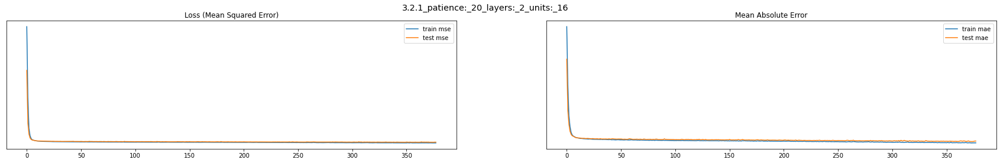

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_2_units:_16              15.030   
1   test:_3.2.1_patience:_20_layers:_2_units:_16              16.445   
2         3.2.1_patience:_20_layers:_2_units:_16               1.415   

   mean_absolute_error  r2_score  e_v_score  
0                2.950    94.825     94.838  
1                3.079    94.390     94.402  
2                0.129     0.435      0.436  

Epoch 1: val_loss improved from inf to 0.10648, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.10648 to 0.03362, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.03362 to 0.02591, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

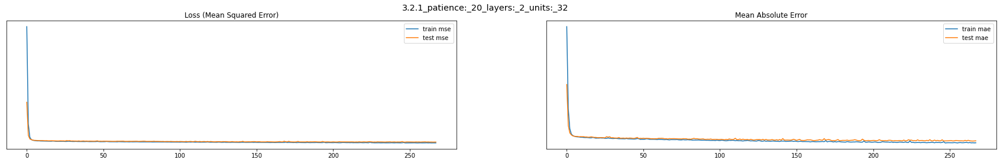

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_2_units:_32              13.559   
1   test:_3.2.1_patience:_20_layers:_2_units:_32              15.355   
2         3.2.1_patience:_20_layers:_2_units:_32               1.796   

   mean_absolute_error  r2_score  e_v_score  
0                2.750    95.331     95.336  
1                2.931    94.762     94.767  
2                0.181     0.569      0.569  

Epoch 1: val_loss improved from inf to 0.02983, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02983 to 0.02470, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02470 to 0.02360, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

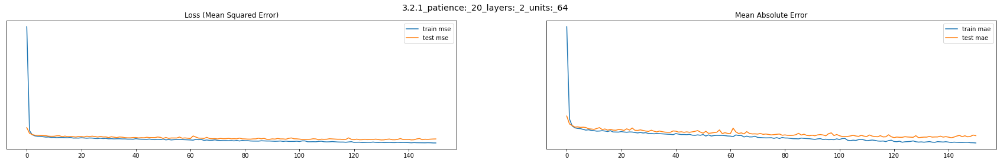

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_2_units:_64              13.252   
1   test:_3.2.1_patience:_20_layers:_2_units:_64              15.822   
2         3.2.1_patience:_20_layers:_2_units:_64               2.569   

   mean_absolute_error  r2_score  e_v_score  
0                2.731    95.437     95.708  
1                2.972    94.603     94.870  
2                0.241     0.834      0.838  

Epoch 1: val_loss improved from inf to 0.19319, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.19319 to 0.05554, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.05554 to 0.03838, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

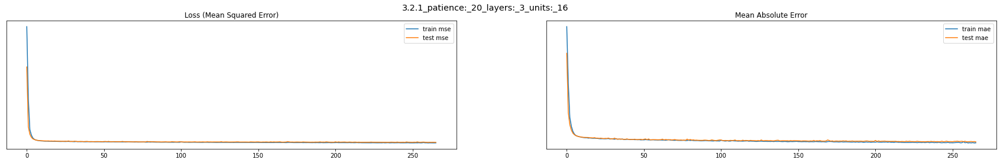

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_3_units:_16              14.706   
1   test:_3.2.1_patience:_20_layers:_3_units:_16              16.001   
2         3.2.1_patience:_20_layers:_3_units:_16               1.295   

   mean_absolute_error  r2_score  e_v_score  
0                2.880    94.936     94.937  
1                2.992    94.542     94.542  
2                0.112     0.394      0.395  

Epoch 1: val_loss improved from inf to 0.07347, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.07347 to 0.02873, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02873 to 0.02485, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

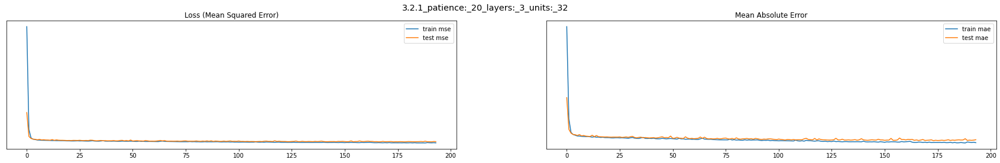

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_3_units:_32              13.281   
1   test:_3.2.1_patience:_20_layers:_3_units:_32              15.315   
2         3.2.1_patience:_20_layers:_3_units:_32               2.035   

   mean_absolute_error  r2_score  e_v_score  
0                2.746    95.427     95.430  
1                2.954    94.776     94.779  
2                0.208     0.651      0.651  

Epoch 1: val_loss improved from inf to 0.03738, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.03738 to 0.02480, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02480 to 0.02256, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

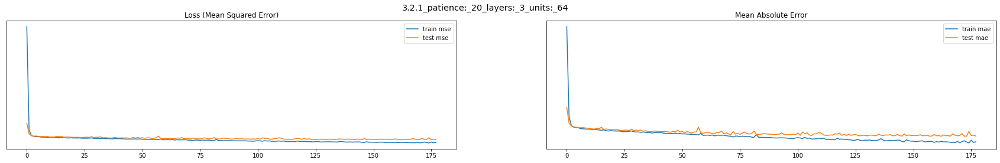

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_3_units:_64              11.150   
1   test:_3.2.1_patience:_20_layers:_3_units:_64              14.598   
2         3.2.1_patience:_20_layers:_3_units:_64               3.448   

   mean_absolute_error  r2_score  e_v_score  
0                2.442    96.161     96.161  
1                2.806    95.020     95.021  
2                0.363     1.141      1.140  

Epoch 1: val_loss improved from inf to 0.26017, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.26017 to 0.09306, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.09306 to 0.03472, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

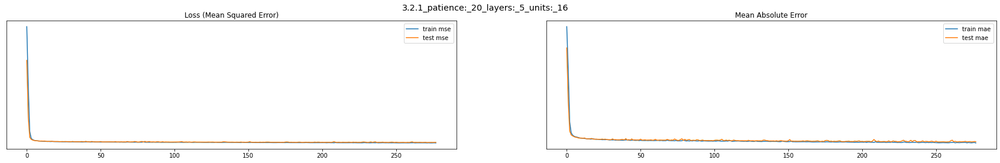

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_5_units:_16              14.401   
1   test:_3.2.1_patience:_20_layers:_5_units:_16              15.949   
2         3.2.1_patience:_20_layers:_5_units:_16               1.549   

   mean_absolute_error  r2_score  e_v_score  
0                2.876    95.042     95.075  
1                3.007    94.559     94.597  
2                0.131     0.483      0.478  

Epoch 1: val_loss improved from inf to 0.06923, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.06923 to 0.03207, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.03207 to 0.02459, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

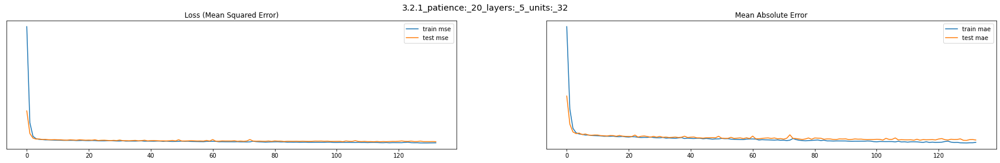

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_5_units:_32              13.094   
1   test:_3.2.1_patience:_20_layers:_5_units:_32              15.166   
2         3.2.1_patience:_20_layers:_5_units:_32               2.073   

   mean_absolute_error  r2_score  e_v_score  
0                2.694    95.492     95.493  
1                2.914    94.827     94.827  
2                0.220     0.665      0.666  

Epoch 1: val_loss improved from inf to 0.03389, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.03389 to 0.02461, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02461 to 0.02327, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

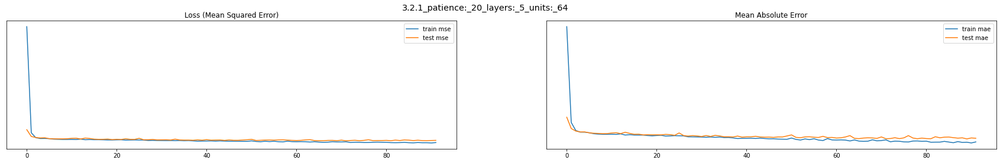

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_5_units:_64              12.860   
1   test:_3.2.1_patience:_20_layers:_5_units:_64              15.564   
2         3.2.1_patience:_20_layers:_5_units:_64               2.704   

   mean_absolute_error  r2_score  e_v_score  
0                2.667    95.572     95.601  
1                2.915    94.691     94.719  
2                0.249     0.881      0.882  

Epoch 1: val_loss improved from inf to 0.17583, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.17583 to 0.04448, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.04448 to 0.02599, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

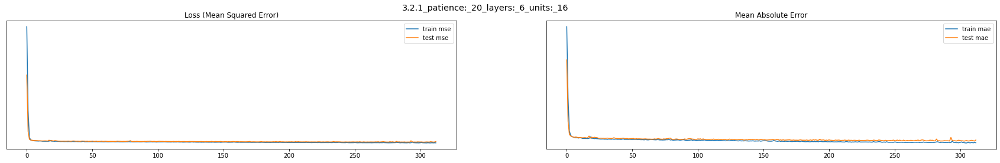

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_6_units:_16              15.220   
1   test:_3.2.1_patience:_20_layers:_6_units:_16              16.888   
2         3.2.1_patience:_20_layers:_6_units:_16               1.668   

   mean_absolute_error  r2_score  e_v_score  
0                2.918    94.760     95.062  
1                3.095    94.239     94.528  
2                0.177     0.521      0.534  

Epoch 1: val_loss improved from inf to 0.06488, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.06488 to 0.03230, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.03230 to 0.02539, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

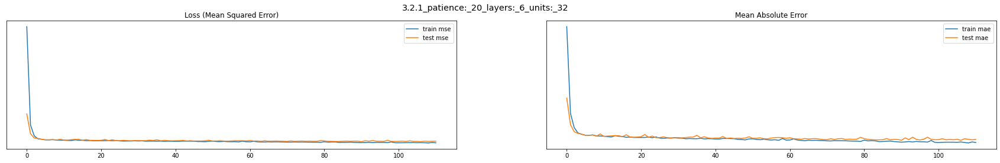

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_6_units:_32              14.052   
1   test:_3.2.1_patience:_20_layers:_6_units:_32              16.062   
2         3.2.1_patience:_20_layers:_6_units:_32               2.010   

   mean_absolute_error  r2_score  e_v_score  
0                2.816    95.162     95.320  
1                3.008    94.521     94.704  
2                0.193     0.641      0.616  

Epoch 1: val_loss improved from inf to 0.03640, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.03640 to 0.02565, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_20_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02565 to 0.02252, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

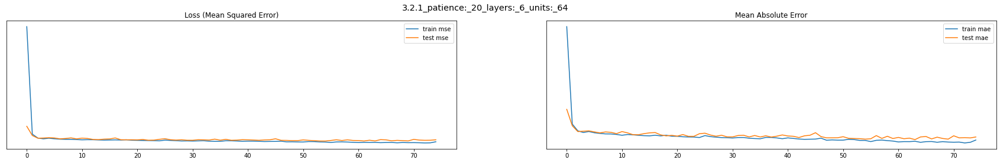

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_20_layers:_6_units:_64              14.599   
1   test:_3.2.1_patience:_20_layers:_6_units:_64              16.650   
2         3.2.1_patience:_20_layers:_6_units:_64               2.051   

   mean_absolute_error  r2_score  e_v_score  
0                2.839    94.973     95.245  
1                3.034    94.320     94.579  
2                0.194     0.653      0.666  

Epoch 1: val_loss improved from inf to 0.24241, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.24241 to 0.12699, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.12699 to 0.04843, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

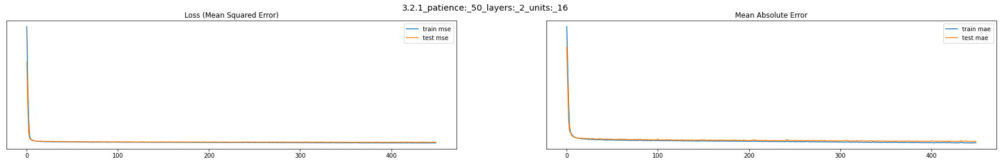

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_2_units:_16              14.640   
1   test:_3.2.1_patience:_50_layers:_2_units:_16              16.173   
2         3.2.1_patience:_50_layers:_2_units:_16               1.533   

   mean_absolute_error  r2_score  e_v_score  
0                2.880    94.959     94.969  
1                3.026    94.483     94.498  
2                0.145     0.476      0.471  

Epoch 1: val_loss improved from inf to 0.13514, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.13514 to 0.04066, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.04066 to 0.03026, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

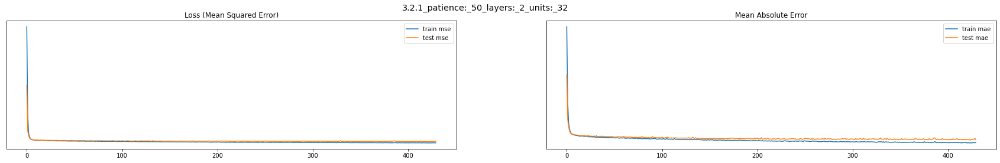

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_2_units:_32              12.689   
1   test:_3.2.1_patience:_50_layers:_2_units:_32              15.359   
2         3.2.1_patience:_50_layers:_2_units:_32               2.670   

   mean_absolute_error  r2_score  e_v_score  
0                2.624    95.631     95.658  
1                2.887    94.761     94.786  
2                0.264     0.870      0.872  

Epoch 1: val_loss improved from inf to 0.03884, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.03884 to 0.02440, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02440 to 0.02277, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

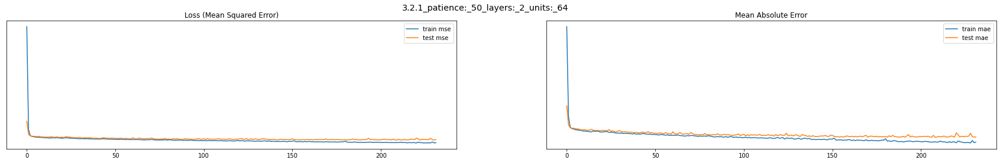

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_2_units:_64              11.996   
1   test:_3.2.1_patience:_50_layers:_2_units:_64              15.069   
2         3.2.1_patience:_50_layers:_2_units:_64               3.073   

   mean_absolute_error  r2_score  e_v_score  
0                2.544     95.87      95.87  
1                2.865     94.86      94.86  
2                0.322      1.01       1.01  

Epoch 1: val_loss improved from inf to 0.07797, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.07797 to 0.03555, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.03555 to 0.03010, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

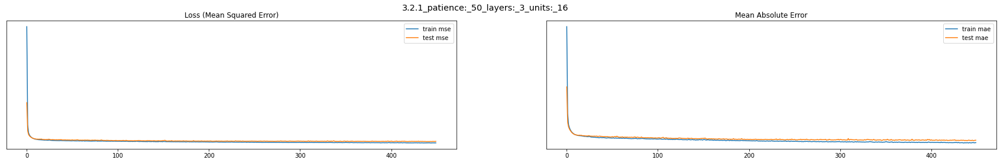

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_3_units:_16              14.142   
1   test:_3.2.1_patience:_50_layers:_3_units:_16              16.047   
2         3.2.1_patience:_50_layers:_3_units:_16               1.905   

   mean_absolute_error  r2_score  e_v_score  
0                2.820    95.131     95.172  
1                2.991    94.526     94.571  
2                0.171     0.605      0.601  

Epoch 1: val_loss improved from inf to 0.05945, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.05945 to 0.03075, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.03075 to 0.02638, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

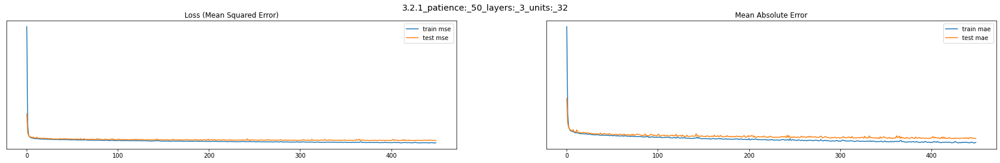

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_3_units:_32              11.771   
1   test:_3.2.1_patience:_50_layers:_3_units:_32              15.123   
2         3.2.1_patience:_50_layers:_3_units:_32               3.352   

   mean_absolute_error  r2_score  e_v_score  
0                2.510    95.947     95.949  
1                2.837    94.841     94.842  
2                0.327     1.106      1.107  

Epoch 1: val_loss improved from inf to 0.03577, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.03577 to 0.02438, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02438 to 0.02286, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

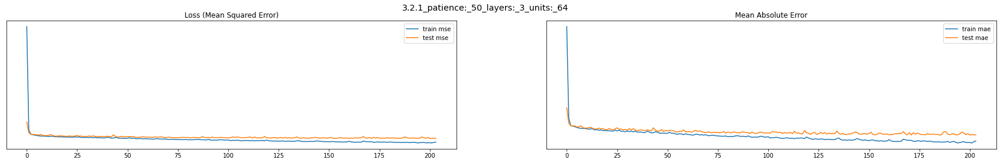

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_3_units:_64              10.929   
1   test:_3.2.1_patience:_50_layers:_3_units:_64              14.924   
2         3.2.1_patience:_50_layers:_3_units:_64               3.995   

   mean_absolute_error  r2_score  e_v_score  
0                2.448    96.237     96.263  
1                2.853    94.909     94.935  
2                0.405     1.328      1.328  

Epoch 1: val_loss improved from inf to 0.21762, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.21762 to 0.07228, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.07228 to 0.03328, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

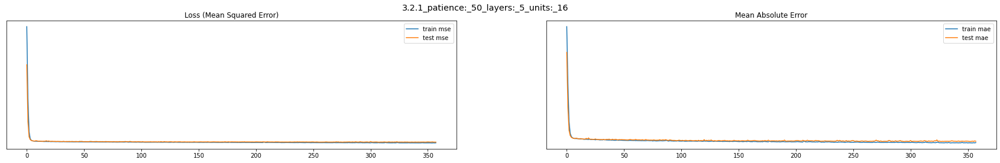

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_5_units:_16              14.050   
1   test:_3.2.1_patience:_50_layers:_5_units:_16              15.908   
2         3.2.1_patience:_50_layers:_5_units:_16               1.859   

   mean_absolute_error  r2_score  e_v_score  
0                2.841    95.162     95.166  
1                3.013    94.573     94.576  
2                0.171     0.589      0.590  

Epoch 1: val_loss improved from inf to 0.12769, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.12769 to 0.02900, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02900 to 0.02385, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

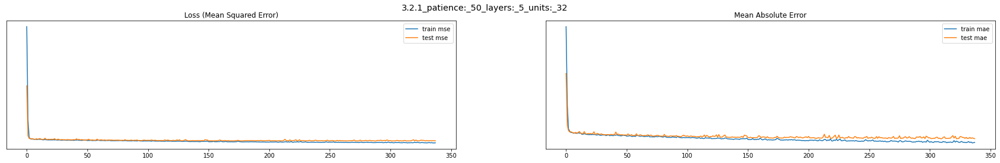

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_5_units:_32              11.698   
1   test:_3.2.1_patience:_50_layers:_5_units:_32              15.317   
2         3.2.1_patience:_50_layers:_5_units:_32               3.619   

   mean_absolute_error  r2_score  e_v_score  
0                2.521    95.972     95.972  
1                2.860    94.775     94.776  
2                0.339     1.197      1.196  

Epoch 1: val_loss improved from inf to 0.03074, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.03074 to 0.02335, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_5_units:_64.hdf5

Epoch 3: val_loss did not improve from 0.02335

Epoch 4: val_loss improved from 0.02335 to 0.02274, saving model to /content

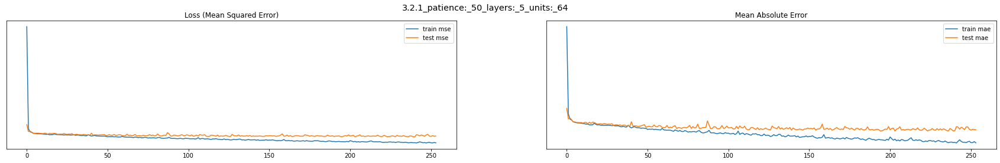

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_5_units:_64               8.699   
1   test:_3.2.1_patience:_50_layers:_5_units:_64              14.915   
2         3.2.1_patience:_50_layers:_5_units:_64               6.216   

   mean_absolute_error  r2_score  e_v_score  
0                2.111    97.005     97.017  
1                2.825    94.912     94.925  
2                0.713     2.093      2.092  

Epoch 1: val_loss improved from inf to 0.18806, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.18806 to 0.04507, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.04507 to 0.03427, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

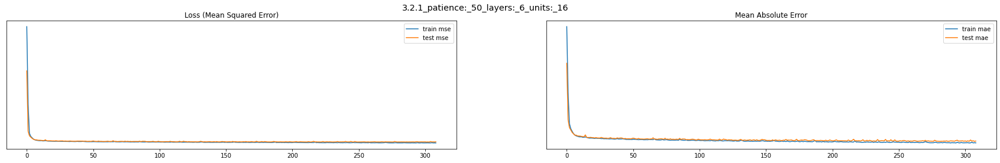

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_6_units:_16              14.021   
1   test:_3.2.1_patience:_50_layers:_6_units:_16              16.146   
2         3.2.1_patience:_50_layers:_6_units:_16               2.125   

   mean_absolute_error  r2_score  e_v_score  
0                2.793    95.172     95.173  
1                2.957    94.492     94.493  
2                0.164     0.680      0.680  

Epoch 1: val_loss improved from inf to 0.05157, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.05157 to 0.02693, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.02693 to 0.02340, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

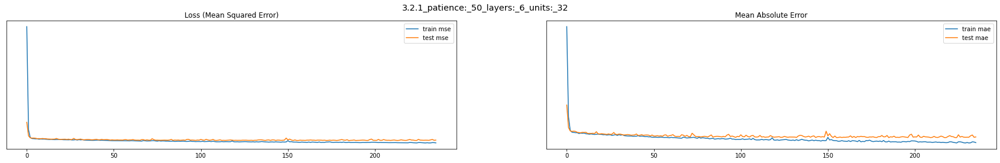

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_6_units:_32              11.631   
1   test:_3.2.1_patience:_50_layers:_6_units:_32              15.556   
2         3.2.1_patience:_50_layers:_6_units:_32               3.925   

   mean_absolute_error  r2_score  e_v_score  
0                2.512    95.995     96.143  
1                2.917    94.694     94.847  
2                0.405     1.301      1.296  

Epoch 1: val_loss improved from inf to 0.04465, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.04465 to 0.02607, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_50_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02607 to 0.02306, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

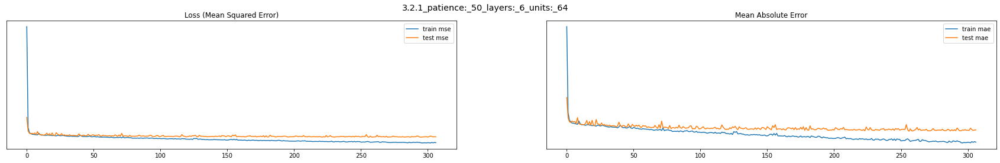

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_50_layers:_6_units:_64               7.601   
1   test:_3.2.1_patience:_50_layers:_6_units:_64              14.760   
2         3.2.1_patience:_50_layers:_6_units:_64               7.159   

   mean_absolute_error  r2_score  e_v_score  
0                1.975    97.383     97.440  
1                2.803    94.965     95.031  
2                0.828     2.418      2.409  

Epoch 1: val_loss improved from inf to 0.11661, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.11661 to 0.04857, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.04857 to 0.03156, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

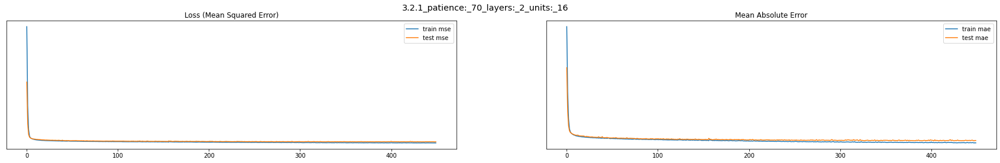

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_2_units:_16              14.272   
1   test:_3.2.1_patience:_70_layers:_2_units:_16              15.949   
2         3.2.1_patience:_70_layers:_2_units:_16               1.677   

   mean_absolute_error  r2_score  e_v_score  
0                2.834    95.086     95.108  
1                3.008    94.560     94.582  
2                0.173     0.526      0.526  

Epoch 1: val_loss improved from inf to 0.08665, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.08665 to 0.04381, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.04381 to 0.02941, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

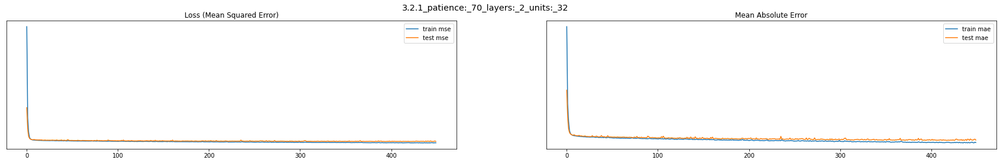

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_2_units:_32              12.891   
1   test:_3.2.1_patience:_70_layers:_2_units:_32              15.467   
2         3.2.1_patience:_70_layers:_2_units:_32               2.576   

   mean_absolute_error  r2_score  e_v_score  
0                2.685    95.561     95.563  
1                2.925    94.724     94.727  
2                0.240     0.837      0.836  

Epoch 1: val_loss improved from inf to 0.04203, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.04203 to 0.02516, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02516 to 0.02327, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

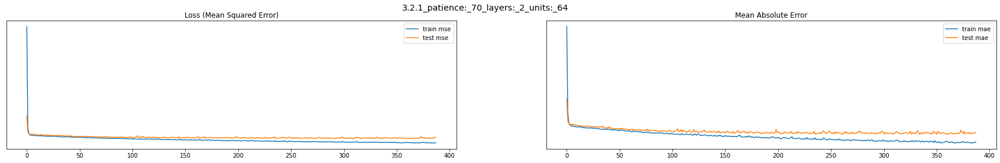

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_2_units:_64              10.919   
1   test:_3.2.1_patience:_70_layers:_2_units:_64              15.374   
2         3.2.1_patience:_70_layers:_2_units:_64               4.455   

   mean_absolute_error  r2_score  e_v_score  
0                2.421    96.240     96.248  
1                2.907    94.756     94.759  
2                0.486     1.484      1.489  

Epoch 1: val_loss improved from inf to 0.24842, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.24842 to 0.07782, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.07782 to 0.03865, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

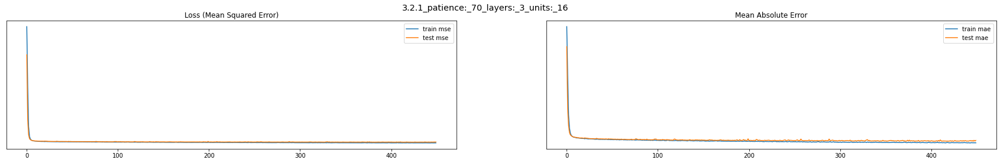

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_3_units:_16              14.518   
1   test:_3.2.1_patience:_70_layers:_3_units:_16              16.102   
2         3.2.1_patience:_70_layers:_3_units:_16               1.584   

   mean_absolute_error  r2_score  e_v_score  
0                2.859    95.001     95.148  
1                3.017    94.507     94.654  
2                0.159     0.494      0.494  

Epoch 1: val_loss improved from inf to 0.06573, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.06573 to 0.03219, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.03219 to 0.02459, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

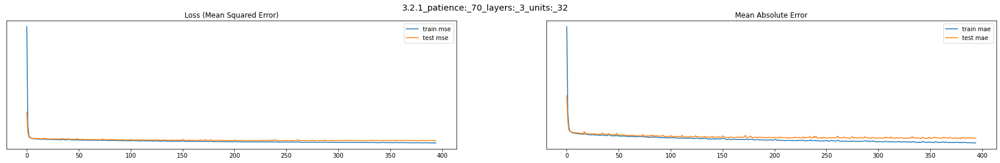

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_3_units:_32              11.419   
1   test:_3.2.1_patience:_70_layers:_3_units:_32              14.573   
2         3.2.1_patience:_70_layers:_3_units:_32               3.154   

   mean_absolute_error  r2_score  e_v_score  
0                2.491    96.068     96.069  
1                2.850    95.029     95.030  
2                0.359     1.039      1.039  

Epoch 1: val_loss improved from inf to 0.03088, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.03088 to 0.02413, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02413 to 0.02283, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

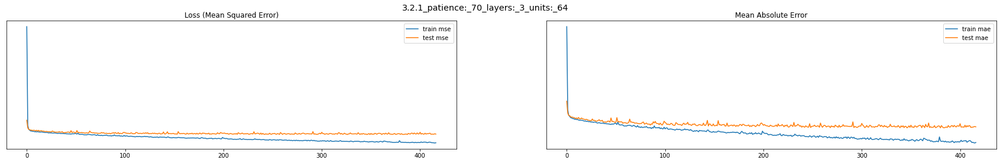

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_3_units:_64               8.620   
1   test:_3.2.1_patience:_70_layers:_3_units:_64              14.999   
2         3.2.1_patience:_70_layers:_3_units:_64               6.380   

   mean_absolute_error  r2_score  e_v_score  
0                2.117    97.032     97.106  
1                2.823    94.884     94.960  
2                0.705     2.148      2.146  

Epoch 1: val_loss improved from inf to 0.26374, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.26374 to 0.15259, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.15259 to 0.04841, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

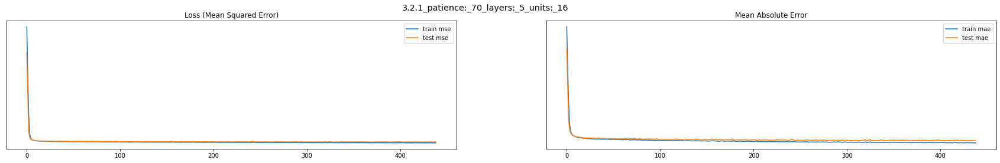

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_5_units:_16              13.381   
1   test:_3.2.1_patience:_70_layers:_5_units:_16              15.752   
2         3.2.1_patience:_70_layers:_5_units:_16               2.371   

   mean_absolute_error  r2_score  e_v_score  
0                2.739    95.393     95.404  
1                2.983    94.627     94.642  
2                0.244     0.766      0.762  

Epoch 1: val_loss improved from inf to 0.07421, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.07421 to 0.02918, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02918 to 0.02503, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

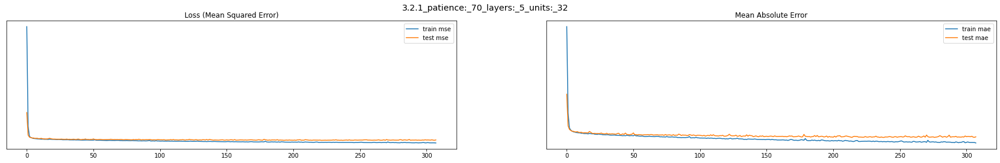

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_5_units:_32              10.984   
1   test:_3.2.1_patience:_70_layers:_5_units:_32              15.687   
2         3.2.1_patience:_70_layers:_5_units:_32               4.702   

   mean_absolute_error  r2_score  e_v_score  
0                2.395    96.218     96.245  
1                2.890    94.649     94.674  
2                0.495     1.569      1.571  

Epoch 1: val_loss improved from inf to 0.03535, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.03535 to 0.02376, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02376 to 0.02334, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

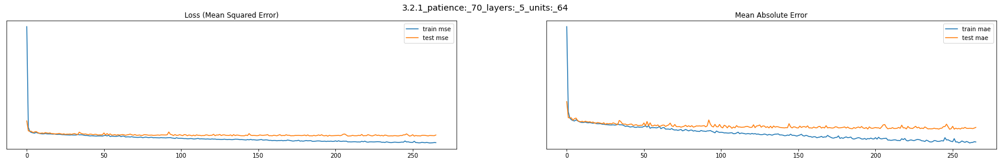

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_5_units:_64               7.811   
1   test:_3.2.1_patience:_70_layers:_5_units:_64              15.206   
2         3.2.1_patience:_70_layers:_5_units:_64               7.395   

   mean_absolute_error  r2_score  e_v_score  
0                2.006    97.311     97.342  
1                2.831    94.813     94.848  
2                0.826     2.498      2.494  

Epoch 1: val_loss improved from inf to 0.22120, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.22120 to 0.08259, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.08259 to 0.03448, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

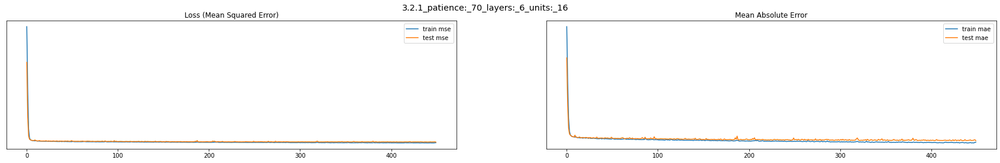

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_6_units:_16              13.640   
1   test:_3.2.1_patience:_70_layers:_6_units:_16              15.579   
2         3.2.1_patience:_70_layers:_6_units:_16               1.939   

   mean_absolute_error  r2_score  e_v_score  
0                2.764    95.304     95.304  
1                2.984    94.686     94.686  
2                0.220     0.618      0.618  

Epoch 1: val_loss improved from inf to 0.08113, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.08113 to 0.03021, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.03021 to 0.02698, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

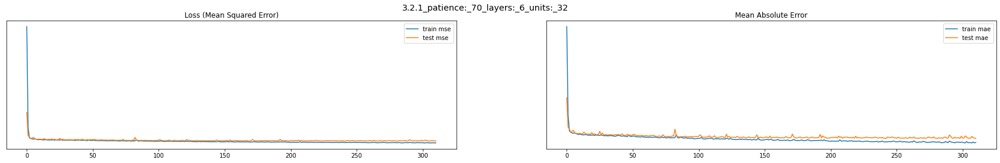

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_6_units:_32              11.079   
1   test:_3.2.1_patience:_70_layers:_6_units:_32              14.711   
2         3.2.1_patience:_70_layers:_6_units:_32               3.631   

   mean_absolute_error  r2_score  e_v_score  
0                2.431    96.185     96.188  
1                2.844    94.982     94.987  
2                0.413     1.203      1.201  

Epoch 1: val_loss improved from inf to 0.03677, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.03677 to 0.02516, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.2.1_patience:_70_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02516 to 0.02299, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/

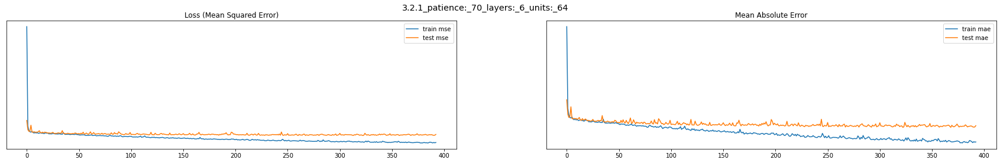

                                            type  mean_squared_error  \
0  train:_3.2.1_patience:_70_layers:_6_units:_64               6.986   
1   test:_3.2.1_patience:_70_layers:_6_units:_64              15.333   
2         3.2.1_patience:_70_layers:_6_units:_64               8.347   

   mean_absolute_error  r2_score  e_v_score  
0                1.888    97.594     97.622  
1                2.825    94.770     94.790  
2                0.937     2.824      2.832  


In [ ]:
patience_list = [20, 50, 70]
units = [16,32, 64]
layers = [2,3,5, 6]
rcpr_transformer = FunctionTransformer(lambda x: 1/x, validate = True)
yj_transformer = PowerTransformer(method = 'yeo-johnson', standardize = False)

pipe_complex = define_pipeline_complex(RobustScaler(),yj_transformer, rcpr_transformer, False, True)
X_train, X_test, y_train, y_test, pipe,  y_test_orig, y_train_orig = split_impute_scale_pipe (pp_dataset, pipe_complex, KNNImputer(n_neighbors=2), True, True)
for p in patience_list:
  for lr in layers:
    for u in units:
      complete_run (f"3.2.1_patience:_{p}_layers:_{lr}_units:_{u}",pipe,pat =  p,  n_layers = lr, unt = u)  

In [ ]:
show_results(isGraph = False)

,modelName,train_mse,test_mse,difference
28,3.2.1_patience:_70_layers:_3_units:_32,11.419,14.573,3.154
5,3.2.1_patience:_20_layers:_3_units:_64,11.150,14.598,3.448
34,3.2.1_patience:_70_layers:_6_units:_32,11.079,14.711,3.631
23,3.2.1_patience:_50_layers:_6_units:_64,7.601,14.760,7.159
20,3.2.1_patience:_50_layers:_5_units:_64,8.699,14.915,6.216
17,3.2.1_patience:_50_layers:_3_units:_64,10.929,14.924,3.995
29,3.2.1_patience:_70_layers:_3_units:_64,8.620,14.999,6.380
14,3.2.1_patience:_50_layers:_2_units:_64,11.996,15.069,3.073
16,3.2.1_patience:_50_layers:_3_units:_32,11.771,15.123,3.352
7,3.2.1_patience:_20_layers:_5_units:_32,13.094,15.166,2.073


<Figure size 2880x1080 with 0 Axes>

In [ ]:
update_results(isFinal = True)
show_results(False)

,modelName,train_mse,test_mse,difference
15,3.3.1_batch:_256_patience:_20_layers:_2_units:_64,11.891,14.550,2.659
31,3.3.1_batch:_256_patience:_20_layers:_2_units:_64,11.891,14.550,2.659
30,3.3.1_batch:_512_patience:_50_layers:_3_units:_32,12.482,14.971,2.488
14,3.3.1_batch:_512_patience:_50_layers:_3_units:_32,12.482,14.971,2.488
6,No3.1.1_Adam_layers:_2_units:_32,12.987,15.232,2.245
22,No3.1.1_Adam_layers:_2_units:_32,12.987,15.232,2.245
8,No3.1.1_Adam_layers:_6_units:_32,12.322,15.302,2.980
24,No3.1.1_Adam_layers:_6_units:_32,12.322,15.302,2.980
23,No3.1.1_Adam_layers:_6_units:_16,13.874,15.533,1.658
7,No3.1.1_Adam_layers:_6_units:_16,13.874,15.533,1.658


<Figure size 2880x1080 with 0 Axes>

Overall it can be seen that with smaller patience values (20, 50) optimal result can be achieved. And on the contrary bigger patience values lead to overfit.

## 3.3 Adam ANN model Batch Size and units


Epoch 1: val_loss improved from inf to 0.03513, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.03513 to 0.02453, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.02453 to 0.02335, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_16.hdf5

Epoch 4: val_loss improved from 0.02335 to 0.02332, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_16.hdf5

Epoch 5: val_loss improved from 0.02332 to 0.02278, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-w

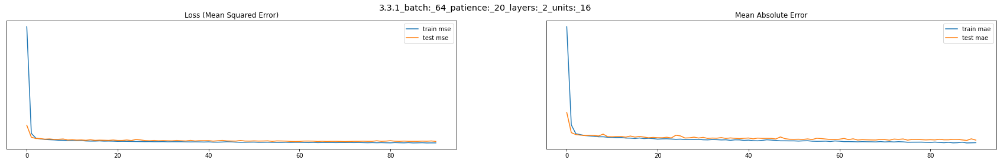

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_2_...              15.478   
1  test:_3.3.1_batch:_64_patience:_20_layers:_2_u...              16.738   
2   3.3.1_batch:_64_patience:_20_layers:_2_units:_16               1.260   

   mean_absolute_error  r2_score  e_v_score  
0                2.976    94.671     94.678  
1                3.108    94.290     94.298  
2                0.132     0.381      0.380  

Epoch 1: val_loss improved from inf to 0.08862, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.08862 to 0.03483, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.03483 to 0.02836, saving model to /content/drive/MyD

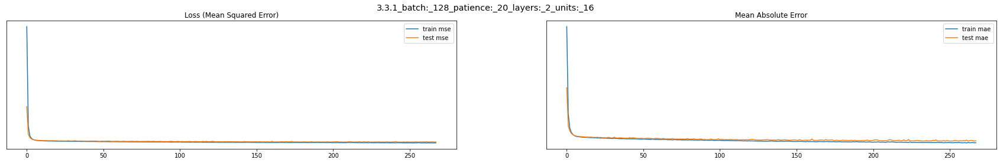

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_2...              14.423   
1  test:_3.3.1_batch:_128_patience:_20_layers:_2_...              16.029   
2  3.3.1_batch:_128_patience:_20_layers:_2_units:_16               1.607   

   mean_absolute_error  r2_score  e_v_score  
0                2.830    95.034     95.080  
1                2.989    94.532     94.576  
2                0.159     0.502      0.504  

Epoch 1: val_loss improved from inf to 0.13135, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.13135 to 0.06501, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.06501 to 0.03392, saving model to /content/drive/MyD

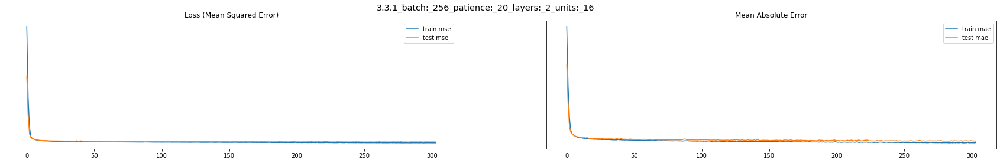

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_2...              15.120   
1  test:_3.3.1_batch:_256_patience:_20_layers:_2_...              16.481   
2  3.3.1_batch:_256_patience:_20_layers:_2_units:_16               1.361   

   mean_absolute_error  r2_score  e_v_score  
0                2.950    94.794     94.815  
1                3.092    94.378     94.398  
2                0.142     0.416      0.417  

Epoch 1: val_loss improved from inf to 0.33225, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.33225 to 0.25246, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.25246 to 0.17346, saving model to /content/drive/MyD

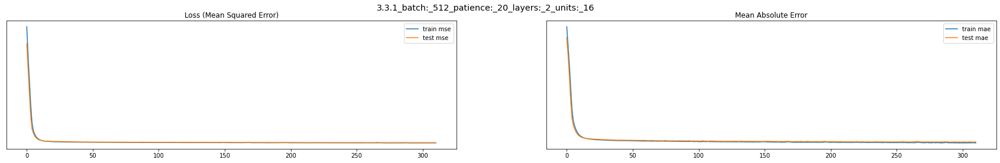

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_2...              15.529   
1  test:_3.3.1_batch:_512_patience:_20_layers:_2_...              16.382   
2  3.3.1_batch:_512_patience:_20_layers:_2_units:_16               0.853   

   mean_absolute_error  r2_score  e_v_score  
0                2.993    94.653     94.665  
1                3.085    94.412     94.422  
2                0.092     0.241      0.243  

Epoch 1: val_loss improved from inf to 0.02517, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.02517 to 0.02295, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.02295 to 0.02254, saving model to /content/drive/MyDri

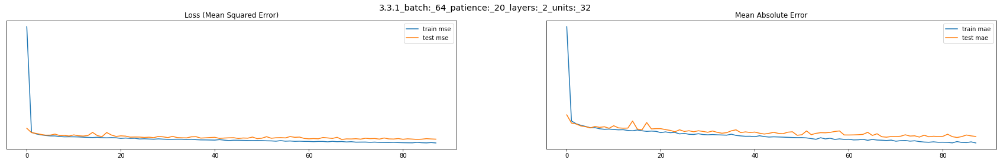

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_2_...              14.015   
1  test:_3.3.1_batch:_64_patience:_20_layers:_2_u...              15.762   
2   3.3.1_batch:_64_patience:_20_layers:_2_units:_32               1.747   

   mean_absolute_error  r2_score  e_v_score  
0                2.820    95.174     95.219  
1                2.978    94.623     94.664  
2                0.158     0.551      0.555  

Epoch 1: val_loss improved from inf to 0.02842, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.02842 to 0.02325, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.02325 to 0.02280, saving model to /content/drive/MyD

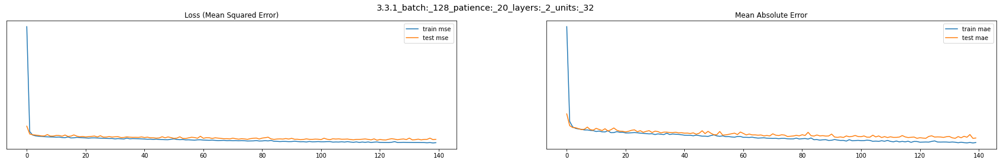

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_2...              14.048   
1  test:_3.3.1_batch:_128_patience:_20_layers:_2_...              15.922   
2  3.3.1_batch:_128_patience:_20_layers:_2_units:_32               1.874   

   mean_absolute_error  r2_score  e_v_score  
0                2.805    95.163     95.179  
1                2.970    94.569     94.583  
2                0.165     0.594      0.596  

Epoch 1: val_loss improved from inf to 0.12868, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.12868 to 0.04601, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.04601 to 0.02990, saving model to /content/drive/MyD

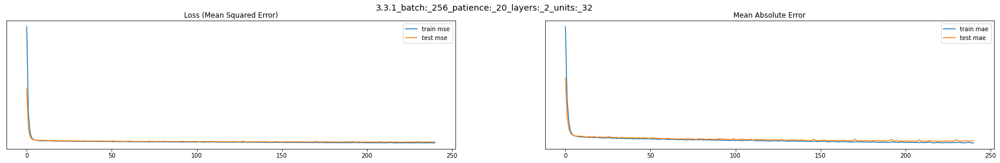

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_2...              14.038   
1  test:_3.3.1_batch:_256_patience:_20_layers:_2_...              15.496   
2  3.3.1_batch:_256_patience:_20_layers:_2_units:_32               1.459   

   mean_absolute_error  r2_score  e_v_score  
0                2.819    95.167     95.246  
1                2.955    94.714     94.798  
2                0.136     0.453      0.448  

Epoch 1: val_loss improved from inf to 0.22288, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.22288 to 0.08286, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.08286 to 0.04622, saving model to /content/drive/MyD

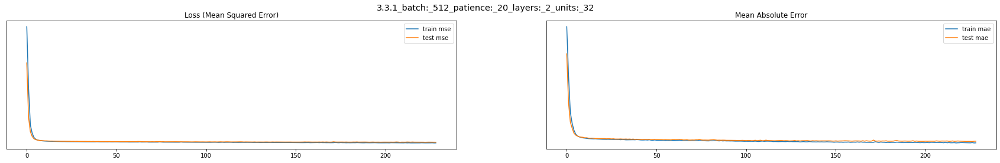

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_2...              14.011   
1  test:_3.3.1_batch:_512_patience:_20_layers:_2_...              15.658   
2  3.3.1_batch:_512_patience:_20_layers:_2_units:_32               1.647   

   mean_absolute_error  r2_score  e_v_score  
0                2.828    95.176     95.177  
1                2.991    94.659     94.660  
2                0.163     0.517      0.517  

Epoch 1: val_loss improved from inf to 0.02324, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02324 to 0.02284, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02284 to 0.02241, saving model to /content/drive/MyDri

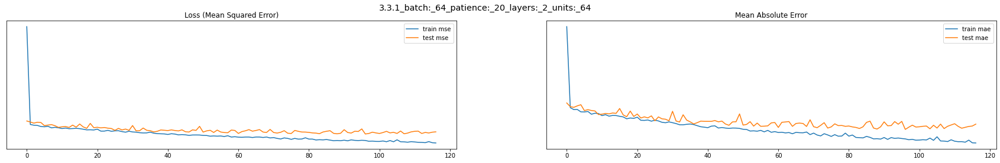

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_2_...              11.624   
1  test:_3.3.1_batch:_64_patience:_20_layers:_2_u...              15.276   
2   3.3.1_batch:_64_patience:_20_layers:_2_units:_64               3.652   

   mean_absolute_error  r2_score  e_v_score  
0                2.539    95.998     96.005  
1                2.926    94.789     94.808  
2                0.387     1.209      1.197  

Epoch 1: val_loss improved from inf to 0.02523, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02523 to 0.02285, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02285 to 0.02270, saving model to /content/drive/MyD

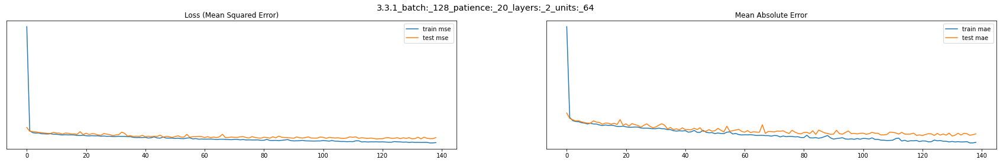

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_2...              12.733   
1  test:_3.3.1_batch:_128_patience:_20_layers:_2_...              15.239   
2  3.3.1_batch:_128_patience:_20_layers:_2_units:_64               2.506   

   mean_absolute_error  r2_score  e_v_score  
0                2.637    95.616     95.680  
1                2.888    94.802     94.876  
2                0.251     0.814      0.804  

Epoch 1: val_loss improved from inf to 0.04114, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.04114 to 0.02512, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02512 to 0.02336, saving model to /content/drive/MyD

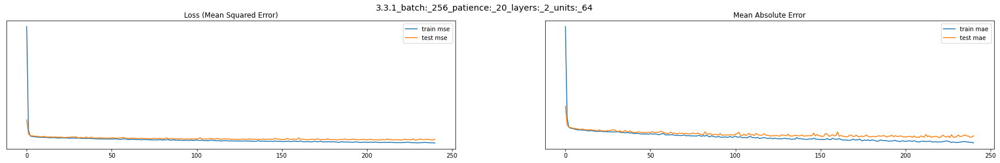

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_2...              12.069   
1  test:_3.3.1_batch:_256_patience:_20_layers:_2_...              15.134   
2  3.3.1_batch:_256_patience:_20_layers:_2_units:_64               3.065   

   mean_absolute_error  r2_score  e_v_score  
0                2.596    95.844     95.966  
1                2.899    94.838     94.987  
2                0.302     1.006      0.979  

Epoch 1: val_loss improved from inf to 0.05373, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.05373 to 0.03225, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.03225 to 0.02663, saving model to /content/drive/MyD

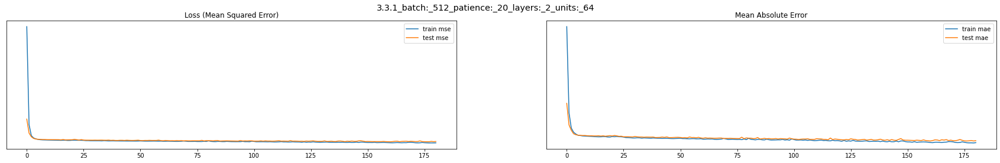

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_2...              14.038   
1  test:_3.3.1_batch:_512_patience:_20_layers:_2_...              15.569   
2  3.3.1_batch:_512_patience:_20_layers:_2_units:_64               1.531   

   mean_absolute_error  r2_score  e_v_score  
0                2.779    95.167     95.174  
1                2.922    94.689     94.701  
2                0.144     0.478      0.473  

Epoch 1: val_loss improved from inf to 0.03015, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.03015 to 0.02499, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.02499 to 0.02362, saving model to /content/drive/MyDri

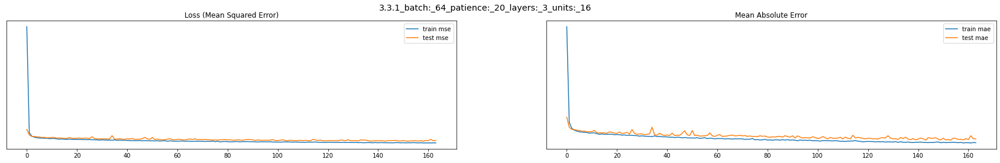

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_3_...              14.239   
1  test:_3.3.1_batch:_64_patience:_20_layers:_3_u...              16.137   
2   3.3.1_batch:_64_patience:_20_layers:_3_units:_16               1.899   

   mean_absolute_error  r2_score  e_v_score  
0                2.802    95.097     95.198  
1                2.987    94.495     94.586  
2                0.184     0.602      0.612  

Epoch 1: val_loss improved from inf to 0.11416, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.11416 to 0.03518, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.03518 to 0.02709, saving model to /content/drive/MyD

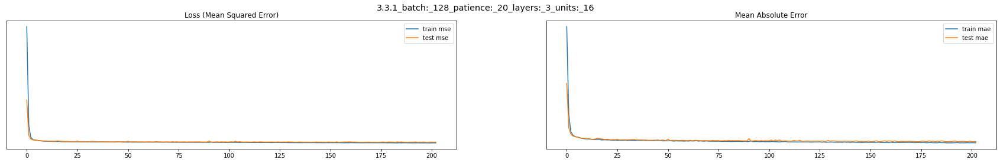

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_3...              14.718   
1  test:_3.3.1_batch:_128_patience:_20_layers:_3_...              16.236   
2  3.3.1_batch:_128_patience:_20_layers:_3_units:_16               1.518   

   mean_absolute_error  r2_score  e_v_score  
0                2.885    94.932     94.987  
1                3.020    94.462     94.508  
2                0.135     0.470      0.479  

Epoch 1: val_loss improved from inf to 0.25865, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.25865 to 0.14298, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.14298 to 0.05479, saving model to /content/drive/MyD

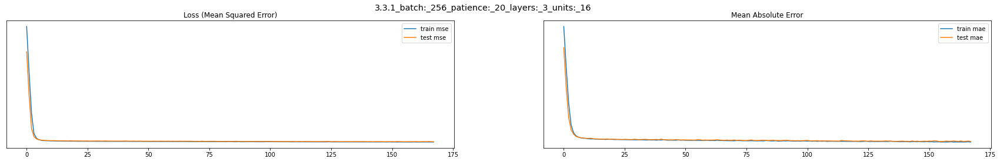

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_3...              15.095   
1  test:_3.3.1_batch:_256_patience:_20_layers:_3_...              16.026   
2  3.3.1_batch:_256_patience:_20_layers:_3_units:_16               0.931   

   mean_absolute_error  r2_score  e_v_score  
0                2.954    94.803     94.813  
1                3.015    94.534     94.544  
2                0.061     0.269      0.269  

Epoch 1: val_loss improved from inf to 0.25377, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.25377 to 0.15874, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.15874 to 0.09529, saving model to /content/drive/MyD

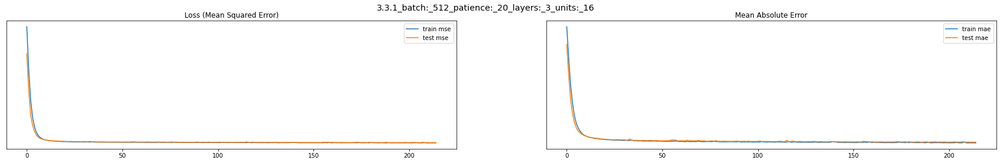

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_3...              16.197   
1  test:_3.3.1_batch:_512_patience:_20_layers:_3_...              16.951   
2  3.3.1_batch:_512_patience:_20_layers:_3_units:_16               0.754   

   mean_absolute_error  r2_score  e_v_score  
0                3.079    94.423     94.492  
1                3.149    94.218     94.286  
2                0.070     0.205      0.206  

Epoch 1: val_loss improved from inf to 0.02500, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.02500 to 0.02355, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02355 to 0.02236, saving model to /content/drive/MyDri

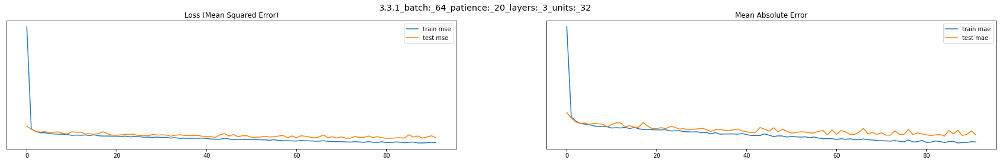

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_3_...              13.198   
1  test:_3.3.1_batch:_64_patience:_20_layers:_3_u...              15.614   
2   3.3.1_batch:_64_patience:_20_layers:_3_units:_32               2.417   

   mean_absolute_error  r2_score  e_v_score  
0                2.706    95.456     95.539  
1                2.945    94.674     94.743  
2                0.239     0.782      0.796  

Epoch 1: val_loss improved from inf to 0.03651, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.03651 to 0.02523, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02523 to 0.02320, saving model to /content/drive/MyD

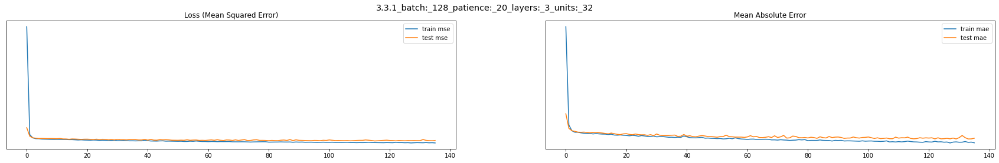

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_3...              13.325   
1  test:_3.3.1_batch:_128_patience:_20_layers:_3_...              15.817   
2  3.3.1_batch:_128_patience:_20_layers:_3_units:_32               2.492   

   mean_absolute_error  r2_score  e_v_score  
0                2.709    95.412     95.467  
1                2.941    94.605     94.661  
2                0.232     0.807      0.806  

Epoch 1: val_loss improved from inf to 0.06298, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.06298 to 0.02848, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02848 to 0.02473, saving model to /content/drive/MyD

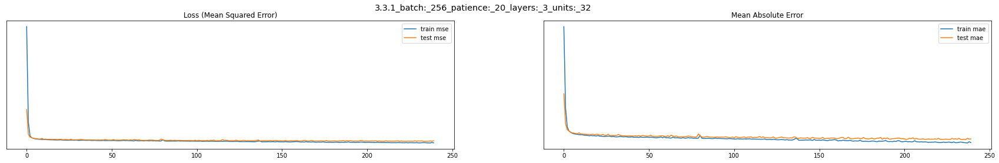

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_3...              13.701   
1  test:_3.3.1_batch:_256_patience:_20_layers:_3_...              15.782   
2  3.3.1_batch:_256_patience:_20_layers:_3_units:_32               2.081   

   mean_absolute_error  r2_score  e_v_score  
0                2.735    95.282     95.412  
1                2.958    94.617     94.737  
2                0.223     0.665      0.675  

Epoch 1: val_loss improved from inf to 0.10694, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.10694 to 0.06131, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.06131 to 0.03499, saving model to /content/drive/MyD

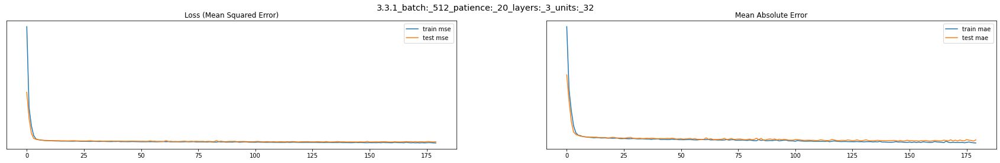

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_3...              14.884   
1  test:_3.3.1_batch:_512_patience:_20_layers:_3_...              16.261   
2  3.3.1_batch:_512_patience:_20_layers:_3_units:_32               1.377   

   mean_absolute_error  r2_score  e_v_score  
0                2.948    94.875     95.061  
1                3.067    94.453     94.624  
2                0.119     0.422      0.437  

Epoch 1: val_loss improved from inf to 0.02410, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.02410 to 0.02239, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_3_units:_64.hdf5

Epoch 3: val_loss did not improve from 0.02239

Epoch 4: val_loss improved from 0.02239 

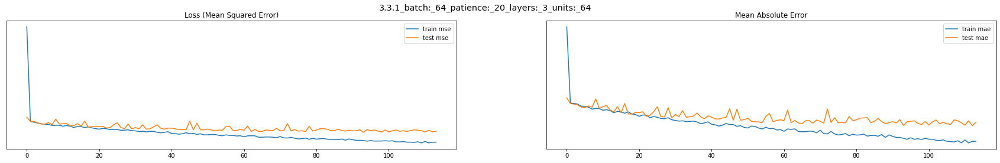

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_3_...              10.595   
1  test:_3.3.1_batch:_64_patience:_20_layers:_3_u...              14.801   
2   3.3.1_batch:_64_patience:_20_layers:_3_units:_64               4.206   

   mean_absolute_error  r2_score  e_v_score  
0                 2.40    96.352     96.378  
1                 2.86    94.951     94.980  
2                 0.46     1.401      1.398  

Epoch 1: val_loss improved from inf to 0.02708, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.02708 to 0.02331, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02331 to 0.02206, saving model to /content/drive/MyD

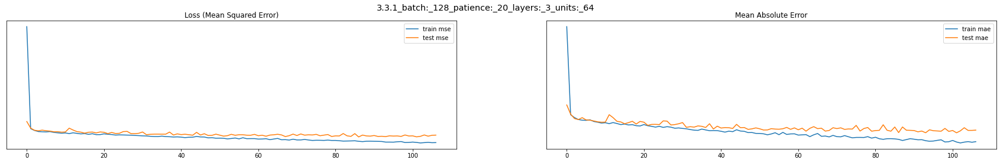

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_3...              11.950   
1  test:_3.3.1_batch:_128_patience:_20_layers:_3_...              15.515   
2  3.3.1_batch:_128_patience:_20_layers:_3_units:_64               3.565   

   mean_absolute_error  r2_score  e_v_score  
0                2.527    95.885     96.011  
1                2.903    94.708     94.825  
2                0.377     1.177      1.186  

Epoch 1: val_loss improved from inf to 0.03917, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.03917 to 0.02602, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02602 to 0.02317, saving model to /content/drive/MyD

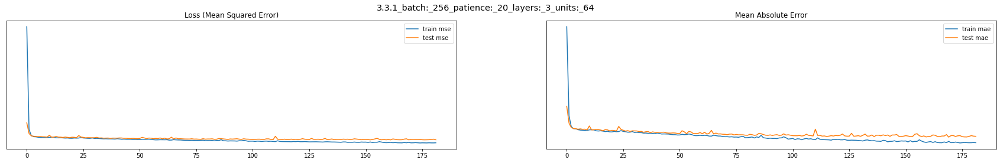

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_3...              11.392   
1  test:_3.3.1_batch:_256_patience:_20_layers:_3_...              14.772   
2  3.3.1_batch:_256_patience:_20_layers:_3_units:_64               3.380   

   mean_absolute_error  r2_score  e_v_score  
0                2.495    96.077     96.079  
1                2.858    94.961     94.964  
2                0.363     1.116      1.115  

Epoch 1: val_loss improved from inf to 0.08381, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.08381 to 0.02913, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02913 to 0.02681, saving model to /content/drive/MyD

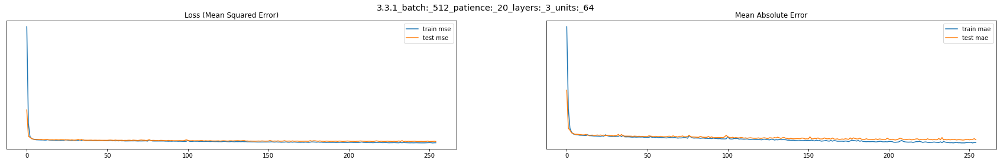

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_3...              12.015   
1  test:_3.3.1_batch:_512_patience:_20_layers:_3_...              14.776   
2  3.3.1_batch:_512_patience:_20_layers:_3_units:_64               2.761   

   mean_absolute_error  r2_score  e_v_score  
0                2.560    95.863     95.879  
1                2.855    94.960     94.977  
2                0.295     0.903      0.902  

Epoch 1: val_loss improved from inf to 0.03231, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.03231 to 0.02439, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.02439 to 0.02343, saving model to /content/drive/MyDri

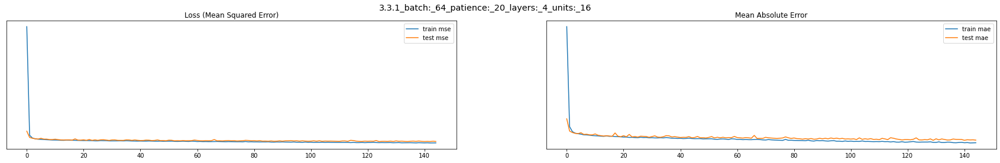

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_4_...              13.850   
1  test:_3.3.1_batch:_64_patience:_20_layers:_4_u...              15.618   
2   3.3.1_batch:_64_patience:_20_layers:_4_units:_16               1.768   

   mean_absolute_error  r2_score  e_v_score  
0                2.792    95.231     95.252  
1                2.963    94.672     94.693  
2                0.171     0.559      0.559  

Epoch 1: val_loss improved from inf to 0.05602, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.05602 to 0.02935, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.02935 to 0.02466, saving model to /content/drive/MyD

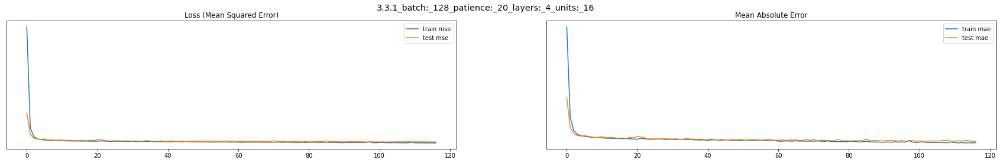

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_4...              15.121   
1  test:_3.3.1_batch:_128_patience:_20_layers:_4_...              16.056   
2  3.3.1_batch:_128_patience:_20_layers:_4_units:_16               0.935   

   mean_absolute_error  r2_score  e_v_score  
0                2.926    94.794     94.808  
1                3.030    94.523     94.536  
2                0.104     0.271      0.272  

Epoch 1: val_loss improved from inf to 0.21499, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.21499 to 0.04472, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.04472 to 0.03158, saving model to /content/drive/MyD

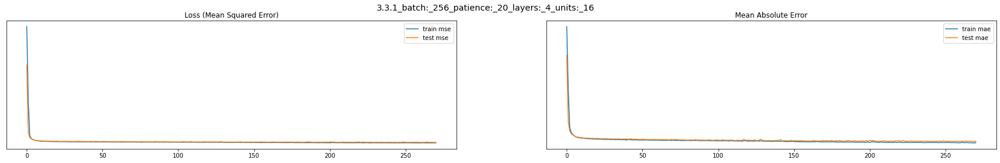

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_4...              14.411   
1  test:_3.3.1_batch:_256_patience:_20_layers:_4_...              15.747   
2  3.3.1_batch:_256_patience:_20_layers:_4_units:_16               1.336   

   mean_absolute_error  r2_score  e_v_score  
0                2.873    95.038     95.038  
1                3.014    94.629     94.629  
2                0.141     0.409      0.409  

Epoch 1: val_loss improved from inf to 0.22460, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.22460 to 0.12997, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.12997 to 0.06645, saving model to /content/drive/MyD

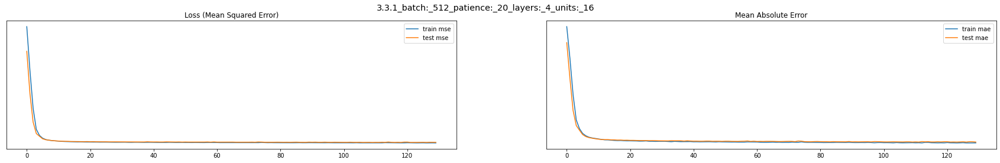

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_4...              16.240   
1  test:_3.3.1_batch:_512_patience:_20_layers:_4_...              17.324   
2  3.3.1_batch:_512_patience:_20_layers:_4_units:_16               1.084   

   mean_absolute_error  r2_score  e_v_score  
0                3.074    94.408     94.431  
1                3.165    94.091     94.110  
2                0.091     0.317      0.321  

Epoch 1: val_loss improved from inf to 0.02544, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.02544 to 0.02335, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_32.hdf5

Epoch 3: val_loss did not improve from 0.02335

Epoch 4: val_loss improved from 0.02335 

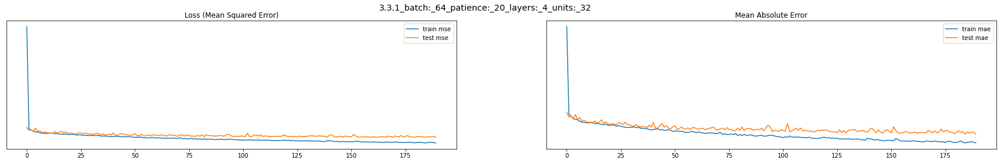

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_4_...              10.689   
1  test:_3.3.1_batch:_64_patience:_20_layers:_4_u...              14.637   
2   3.3.1_batch:_64_patience:_20_layers:_4_units:_32               3.948   

   mean_absolute_error  r2_score  e_v_score  
0                2.388    96.320     96.321  
1                2.788    95.007     95.012  
2                0.401     1.313      1.309  

Epoch 1: val_loss improved from inf to 0.02718, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.02718 to 0.02409, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.02409 to 0.02332, saving model to /content/drive/MyD

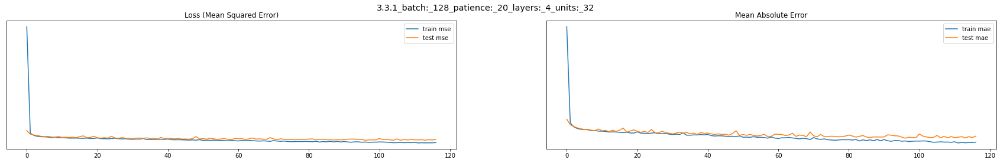

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_4...              13.349   
1  test:_3.3.1_batch:_128_patience:_20_layers:_4_...              15.769   
2  3.3.1_batch:_128_patience:_20_layers:_4_units:_32               2.420   

   mean_absolute_error  r2_score  e_v_score  
0                2.751    95.404     95.564  
1                2.981    94.621     94.780  
2                0.230     0.783      0.784  

Epoch 1: val_loss improved from inf to 0.07802, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.07802 to 0.02972, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.02972 to 0.02394, saving model to /content/drive/MyD

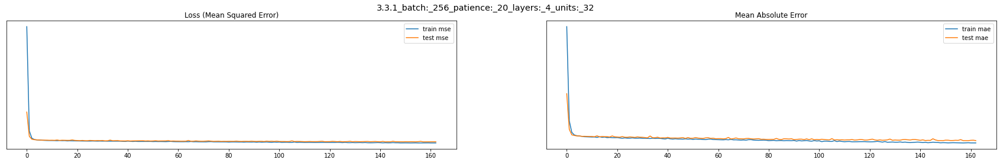

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_4...              12.978   
1  test:_3.3.1_batch:_256_patience:_20_layers:_4_...              15.224   
2  3.3.1_batch:_256_patience:_20_layers:_4_units:_32               2.245   

   mean_absolute_error  r2_score  e_v_score  
0                2.666    95.531     95.531  
1                2.904    94.807     94.807  
2                0.238     0.724      0.724  

Epoch 1: val_loss improved from inf to 0.18108, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.18108 to 0.05954, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.05954 to 0.03216, saving model to /content/drive/MyD

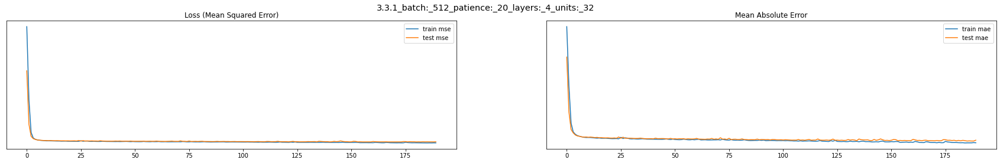

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_4...              13.975   
1  test:_3.3.1_batch:_512_patience:_20_layers:_4_...              15.945   
2  3.3.1_batch:_512_patience:_20_layers:_4_units:_32               1.970   

   mean_absolute_error  r2_score  e_v_score  
0                2.823    95.188     95.311  
1                3.005    94.561     94.681  
2                0.182     0.627      0.630  

Epoch 1: val_loss improved from inf to 0.02453, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.02453 to 0.02277, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.02277 to 0.02216, saving model to /content/drive/MyDri

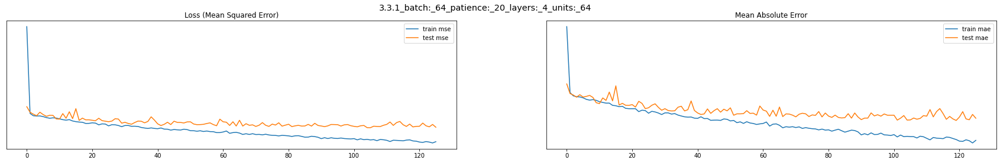

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_4_...              10.199   
1  test:_3.3.1_batch:_64_patience:_20_layers:_4_u...              14.483   
2   3.3.1_batch:_64_patience:_20_layers:_4_units:_64               4.283   

   mean_absolute_error  r2_score  e_v_score  
0                2.357    96.488     96.525  
1                2.815    95.060     95.099  
2                0.458     1.428      1.426  

Epoch 1: val_loss improved from inf to 0.02376, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.02376 to 0.02364, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.02364 to 0.02184, saving model to /content/drive/MyD

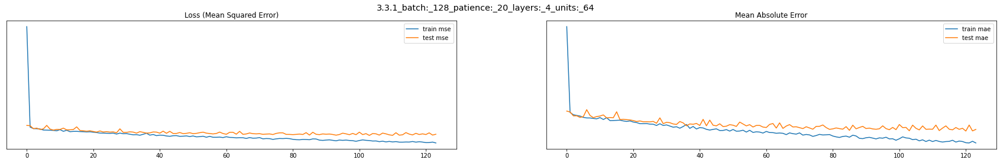

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_4...              10.793   
1  test:_3.3.1_batch:_128_patience:_20_layers:_4_...              14.957   
2  3.3.1_batch:_128_patience:_20_layers:_4_units:_64               4.164   

   mean_absolute_error  r2_score  e_v_score  
0                2.376    96.284     96.307  
1                2.819    94.898     94.919  
2                0.443     1.386      1.388  

Epoch 1: val_loss improved from inf to 0.03755, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.03755 to 0.02571, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.02571 to 0.02329, saving model to /content/drive/MyD

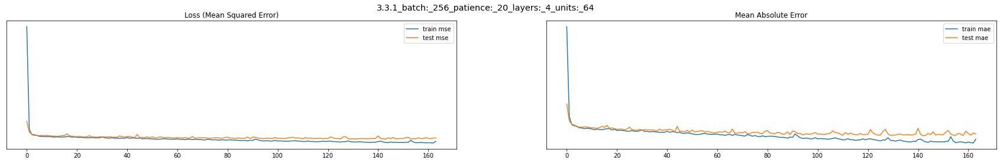

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_4...              11.895   
1  test:_3.3.1_batch:_256_patience:_20_layers:_4_...              15.561   
2  3.3.1_batch:_256_patience:_20_layers:_4_units:_64               3.666   

   mean_absolute_error  r2_score  e_v_score  
0                2.522    95.904     96.007  
1                2.882    94.692     94.801  
2                0.360     1.212      1.206  

Epoch 1: val_loss improved from inf to 0.06109, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.06109 to 0.03907, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.03907 to 0.02921, saving model to /content/drive/MyD

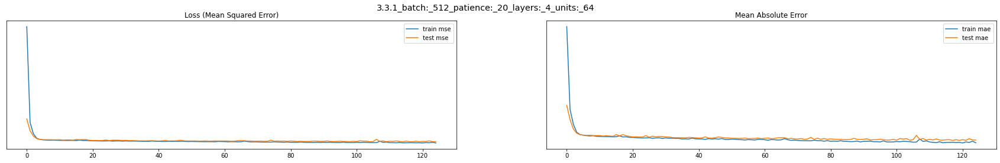

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_4...              13.517   
1  test:_3.3.1_batch:_512_patience:_20_layers:_4_...              15.455   
2  3.3.1_batch:_512_patience:_20_layers:_4_units:_64               1.938   

   mean_absolute_error  r2_score  e_v_score  
0                2.757    95.346     95.498  
1                2.936    94.728     94.857  
2                0.179     0.618      0.641  

Epoch 1: val_loss improved from inf to 0.02899, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.02899 to 0.02534, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.02534 to 0.02457, saving model to /content/drive/MyDri

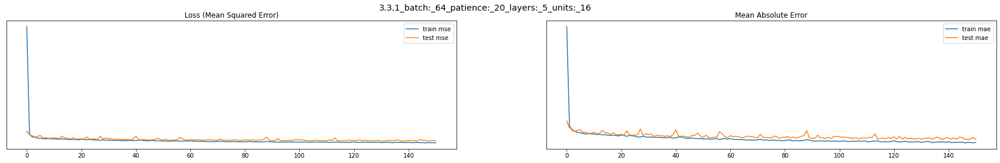

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_5_...              14.254   
1  test:_3.3.1_batch:_64_patience:_20_layers:_5_u...              15.810   
2   3.3.1_batch:_64_patience:_20_layers:_5_units:_16               1.556   

   mean_absolute_error  r2_score  e_v_score  
0                2.801    95.092     95.183  
1                2.980    94.607     94.692  
2                0.179     0.485      0.491  

Epoch 1: val_loss improved from inf to 0.06467, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.06467 to 0.03301, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.03301 to 0.02896, saving model to /content/drive/MyD

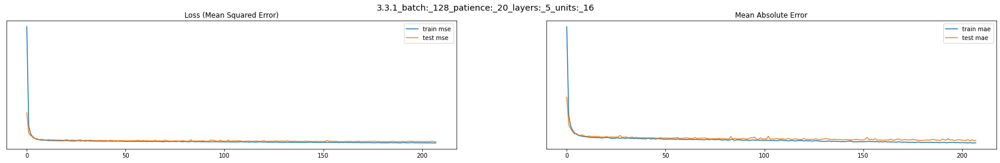

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_5...              13.789   
1  test:_3.3.1_batch:_128_patience:_20_layers:_5_...              15.769   
2  3.3.1_batch:_128_patience:_20_layers:_5_units:_16               1.980   

   mean_absolute_error  r2_score  e_v_score  
0                2.786    95.252     95.253  
1                2.980    94.621     94.622  
2                0.195     0.631      0.631  

Epoch 1: val_loss improved from inf to 0.25296, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.25296 to 0.08666, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.08666 to 0.04660, saving model to /content/drive/MyD

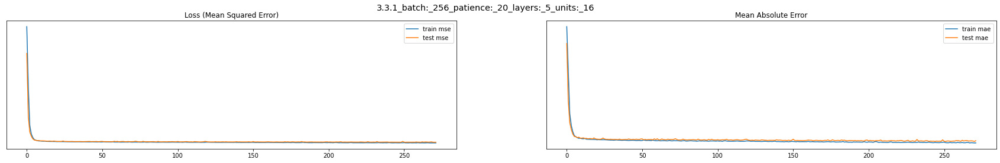

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_5...              14.681   
1  test:_3.3.1_batch:_256_patience:_20_layers:_5_...              16.146   
2  3.3.1_batch:_256_patience:_20_layers:_5_units:_16               1.465   

   mean_absolute_error  r2_score  e_v_score  
0                2.940    94.945     94.958  
1                3.082    94.492     94.501  
2                0.141     0.453      0.457  

Epoch 1: val_loss improved from inf to 0.33650, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.33650 to 0.26865, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.26865 to 0.16598, saving model to /content/drive/MyD

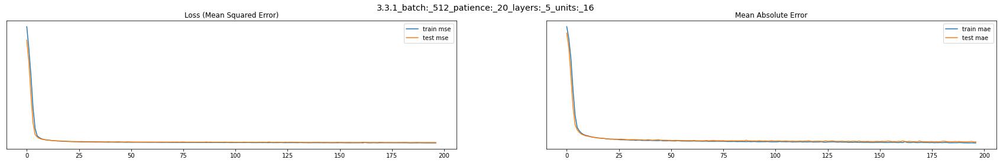

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_5...              15.479   
1  test:_3.3.1_batch:_512_patience:_20_layers:_5_...              16.730   
2  3.3.1_batch:_512_patience:_20_layers:_5_units:_16               1.251   

   mean_absolute_error  r2_score  e_v_score  
0                2.979    94.670     94.695  
1                3.104    94.293     94.314  
2                0.125     0.377      0.381  

Epoch 1: val_loss improved from inf to 0.02405, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.02405 to 0.02311, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02311 to 0.02257, saving model to /content/drive/MyDri

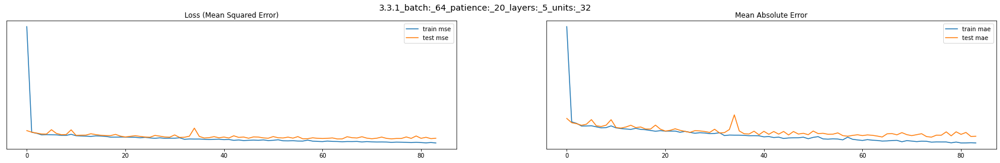

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_5_...              13.031   
1  test:_3.3.1_batch:_64_patience:_20_layers:_5_u...              15.690   
2   3.3.1_batch:_64_patience:_20_layers:_5_units:_32               2.659   

   mean_absolute_error  r2_score  e_v_score  
0                2.687    95.513     95.534  
1                2.945    94.648     94.672  
2                0.258     0.865      0.862  

Epoch 1: val_loss improved from inf to 0.02951, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.02951 to 0.02421, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02421 to 0.02289, saving model to /content/drive/MyD

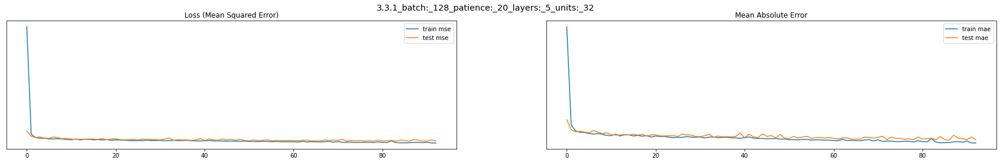

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_5...              13.788   
1  test:_3.3.1_batch:_128_patience:_20_layers:_5_...              15.751   
2  3.3.1_batch:_128_patience:_20_layers:_5_units:_32               1.963   

   mean_absolute_error  r2_score  e_v_score  
0                2.761    95.252     95.277  
1                2.944    94.627     94.651  
2                0.183     0.625      0.626  

Epoch 1: val_loss improved from inf to 0.09076, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.09076 to 0.03234, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.03234 to 0.02497, saving model to /content/drive/MyD

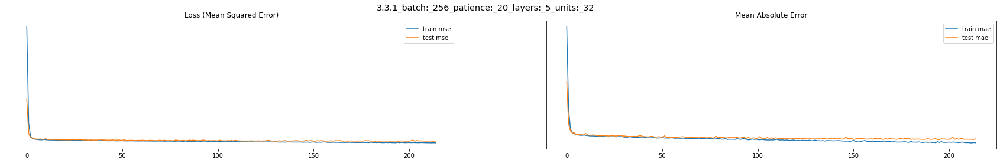

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_5...              12.960   
1  test:_3.3.1_batch:_256_patience:_20_layers:_5_...              15.518   
2  3.3.1_batch:_256_patience:_20_layers:_5_units:_32               2.558   

   mean_absolute_error  r2_score  e_v_score  
0                2.693    95.538     95.631  
1                2.954    94.707     94.785  
2                0.261     0.831      0.846  

Epoch 1: val_loss improved from inf to 0.18627, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.18627 to 0.05267, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.05267 to 0.03239, saving model to /content/drive/MyD

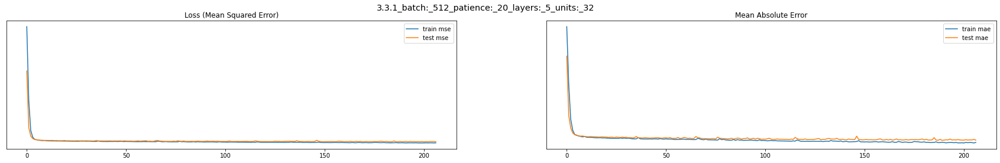

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_5...              12.883   
1  test:_3.3.1_batch:_512_patience:_20_layers:_5_...              15.557   
2  3.3.1_batch:_512_patience:_20_layers:_5_units:_32               2.674   

   mean_absolute_error  r2_score  e_v_score  
0                2.658    95.564     95.564  
1                2.938    94.693     94.694  
2                0.280     0.871      0.870  

Epoch 1: val_loss improved from inf to 0.02534, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_64.hdf5

Epoch 2: val_loss did not improve from 0.02534

Epoch 3: val_loss improved from 0.02534 to 0.02340, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_5_units:_64.hdf5

Epoch 4: val_loss improved from 0.02340 

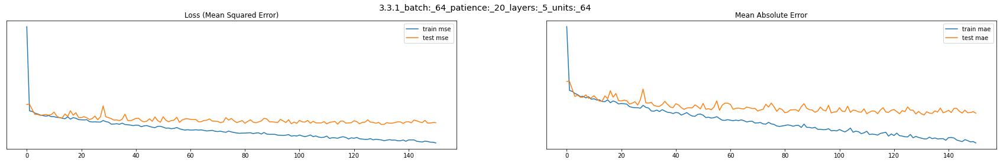

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_5_...               8.093   
1  test:_3.3.1_batch:_64_patience:_20_layers:_5_u...              14.763   
2   3.3.1_batch:_64_patience:_20_layers:_5_units:_64               6.670   

   mean_absolute_error  r2_score  e_v_score  
0                2.043    97.213     97.243  
1                2.791    94.964     95.002  
2                0.749     2.249      2.241  

Epoch 1: val_loss improved from inf to 0.02427, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.02427 to 0.02368, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02368 to 0.02217, saving model to /content/drive/MyD

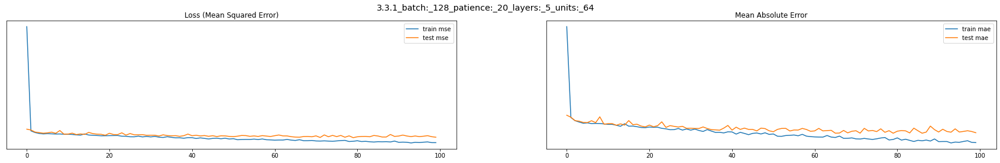

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_5...              10.822   
1  test:_3.3.1_batch:_128_patience:_20_layers:_5_...              14.810   
2  3.3.1_batch:_128_patience:_20_layers:_5_units:_64               3.988   

   mean_absolute_error  r2_score  e_v_score  
0                2.401    96.274     96.319  
1                2.832    94.948     95.002  
2                0.432     1.326      1.317  

Epoch 1: val_loss improved from inf to 0.04005, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.04005 to 0.02661, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02661 to 0.02264, saving model to /content/drive/MyD

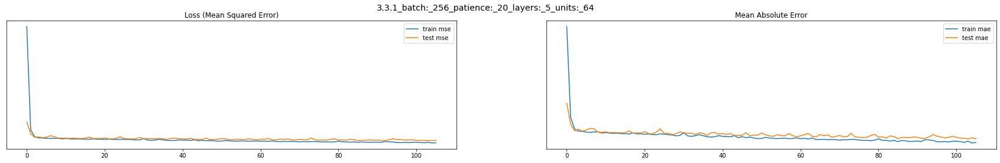

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_5...              12.497   
1  test:_3.3.1_batch:_256_patience:_20_layers:_5_...              15.324   
2  3.3.1_batch:_256_patience:_20_layers:_5_units:_64               2.828   

   mean_absolute_error  r2_score  e_v_score  
0                2.620    95.697     95.716  
1                2.882    94.773     94.786  
2                0.262     0.924      0.930  

Epoch 1: val_loss improved from inf to 0.09851, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.09851 to 0.04001, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.04001 to 0.03165, saving model to /content/drive/MyD

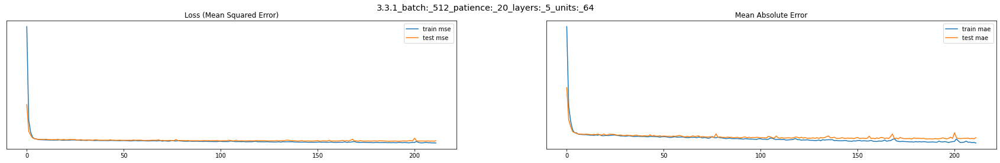

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_5...              11.993   
1  test:_3.3.1_batch:_512_patience:_20_layers:_5_...              15.482   
2  3.3.1_batch:_512_patience:_20_layers:_5_units:_64               3.489   

   mean_absolute_error  r2_score  e_v_score  
0                2.589    95.871     96.058  
1                2.947    94.719     94.891  
2                0.358     1.152      1.167  

Epoch 1: val_loss improved from inf to 0.03838, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.03838 to 0.02719, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.02719 to 0.02417, saving model to /content/drive/MyDri

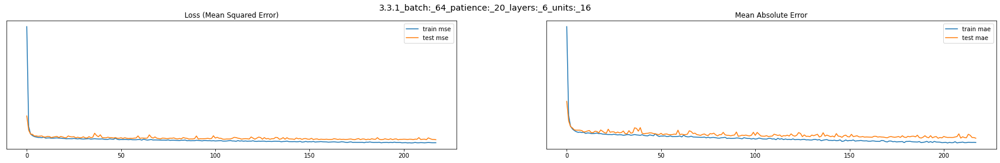

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_6_...              13.275   
1  test:_3.3.1_batch:_64_patience:_20_layers:_6_u...              15.890   
2   3.3.1_batch:_64_patience:_20_layers:_6_units:_16               2.615   

   mean_absolute_error  r2_score  e_v_score  
0                2.724    95.429     95.430  
1                2.971    94.580     94.582  
2                0.246     0.849      0.848  

Epoch 1: val_loss improved from inf to 0.08098, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.08098 to 0.02840, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.02840 to 0.02593, saving model to /content/drive/MyD

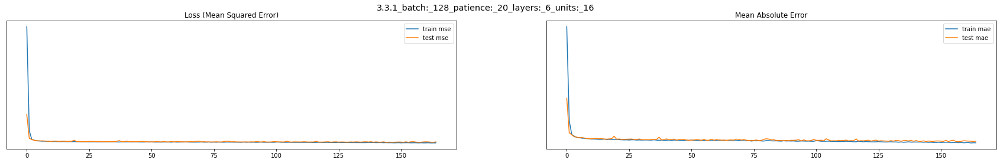

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_6...              15.029   
1  test:_3.3.1_batch:_128_patience:_20_layers:_6_...              16.539   
2  3.3.1_batch:_128_patience:_20_layers:_6_units:_16               1.510   

   mean_absolute_error  r2_score  e_v_score  
0                2.899    94.825     94.967  
1                3.032    94.358     94.514  
2                0.133     0.467      0.453  

Epoch 1: val_loss improved from inf to 0.24255, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.24255 to 0.11214, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.11214 to 0.07858, saving model to /content/drive/MyD

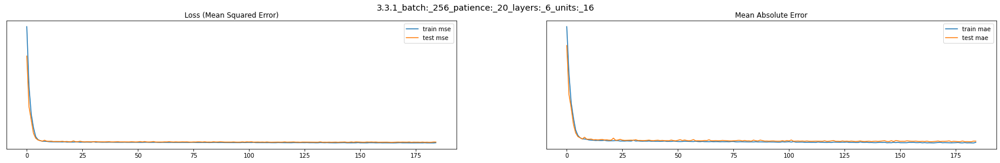

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_6...              15.591   
1  test:_3.3.1_batch:_256_patience:_20_layers:_6_...              17.120   
2  3.3.1_batch:_256_patience:_20_layers:_6_units:_16               1.529   

   mean_absolute_error  r2_score  e_v_score  
0                3.005    94.632     94.740  
1                3.140    94.160     94.267  
2                0.134     0.472      0.473  

Epoch 1: val_loss improved from inf to 0.30498, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.30498 to 0.20311, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.20311 to 0.10624, saving model to /content/drive/MyD

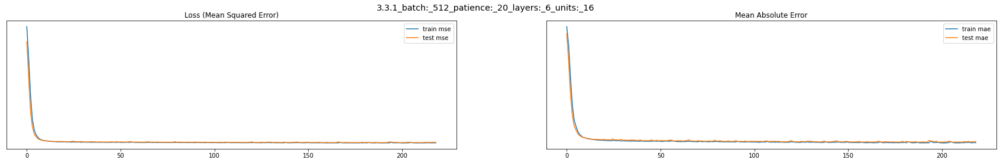

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_6...              16.399   
1  test:_3.3.1_batch:_512_patience:_20_layers:_6_...              17.079   
2  3.3.1_batch:_512_patience:_20_layers:_6_units:_16               0.680   

   mean_absolute_error  r2_score  e_v_score  
0                3.131    94.353     94.565  
1                3.180    94.174     94.384  
2                0.049     0.179      0.181  

Epoch 1: val_loss improved from inf to 0.02458, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.02458 to 0.02263, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.02263 to 0.02214, saving model to /content/drive/MyDri

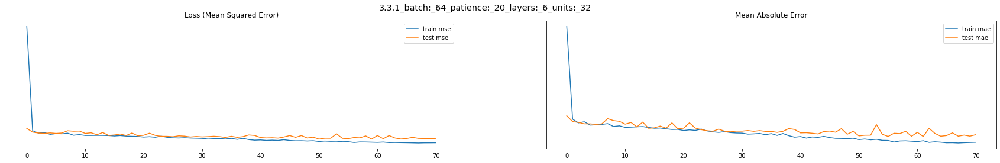

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_6_...              13.079   
1  test:_3.3.1_batch:_64_patience:_20_layers:_6_u...              15.490   
2   3.3.1_batch:_64_patience:_20_layers:_6_units:_32               2.411   

   mean_absolute_error  r2_score  e_v_score  
0                2.719    95.497     95.508  
1                2.957    94.716     94.731  
2                0.238     0.781      0.777  

Epoch 1: val_loss improved from inf to 0.03042, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.03042 to 0.02394, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.02394 to 0.02283, saving model to /content/drive/MyD

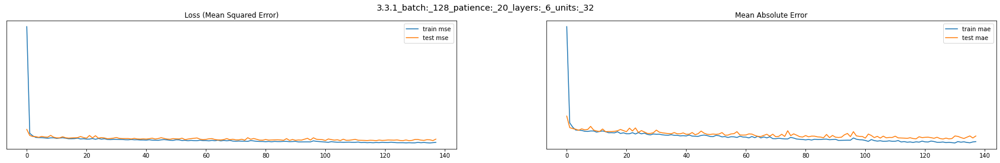

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_6...              13.409   
1  test:_3.3.1_batch:_128_patience:_20_layers:_6_...              16.104   
2  3.3.1_batch:_128_patience:_20_layers:_6_units:_32               2.694   

   mean_absolute_error  r2_score  e_v_score  
0                2.716    95.383     95.699  
1                2.971    94.507     94.820  
2                0.255     0.876      0.879  

Epoch 1: val_loss improved from inf to 0.04574, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.04574 to 0.02736, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.02736 to 0.02455, saving model to /content/drive/MyD

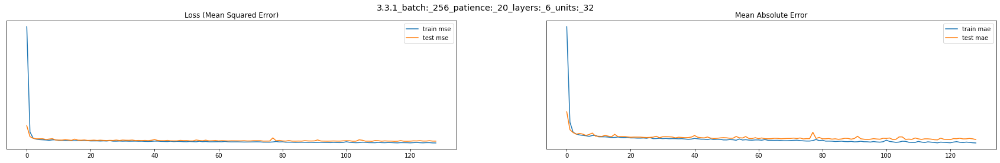

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_6...              13.051   
1  test:_3.3.1_batch:_256_patience:_20_layers:_6_...              15.884   
2  3.3.1_batch:_256_patience:_20_layers:_6_units:_32               2.833   

   mean_absolute_error  r2_score  e_v_score  
0                2.683    95.506     95.540  
1                2.966    94.582     94.624  
2                0.283     0.924      0.916  

Epoch 1: val_loss improved from inf to 0.21065, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.21065 to 0.04345, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.04345 to 0.02912, saving model to /content/drive/MyD

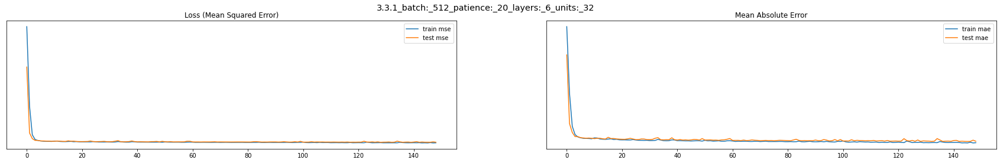

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_6...              14.705   
1  test:_3.3.1_batch:_512_patience:_20_layers:_6_...              16.176   
2  3.3.1_batch:_512_patience:_20_layers:_6_units:_32               1.471   

   mean_absolute_error  r2_score  e_v_score  
0                2.902    94.937     94.948  
1                3.047    94.482     94.492  
2                0.145     0.455      0.456  

Epoch 1: val_loss improved from inf to 0.02328, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.02328 to 0.02241, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_20_layers:_6_units:_64.hdf5

Epoch 3: val_loss did not improve from 0.02241

Epoch 4: val_loss improved from 0.02241 

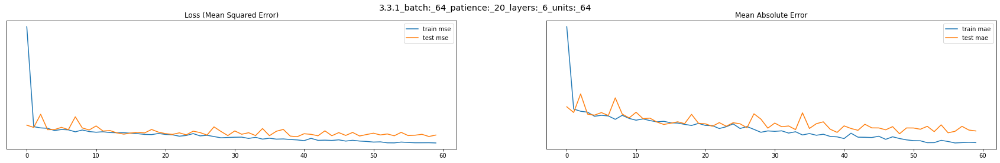

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_20_layers:_6_...              12.620   
1  test:_3.3.1_batch:_64_patience:_20_layers:_6_u...              15.644   
2   3.3.1_batch:_64_patience:_20_layers:_6_units:_64               3.025   

   mean_absolute_error  r2_score  e_v_score  
0                2.627    95.655     95.676  
1                2.913    94.664     94.678  
2                0.286     0.991      0.998  

Epoch 1: val_loss improved from inf to 0.02336, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.02336 to 0.02224, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_20_layers:_6_units:_64.hdf5

Epoch 3: val_loss did not improve from 0.02224

Epoch 4: val_loss improved from 0.0222

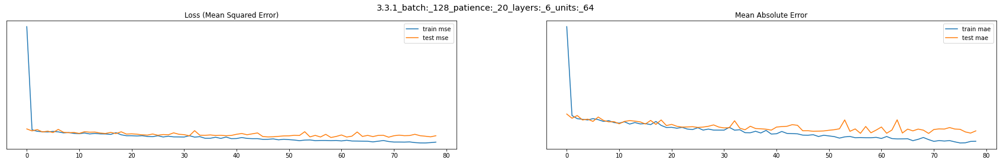

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_20_layers:_6...              12.455   
1  test:_3.3.1_batch:_128_patience:_20_layers:_6_...              15.667   
2  3.3.1_batch:_128_patience:_20_layers:_6_units:_64               3.211   

   mean_absolute_error  r2_score  e_v_score  
0                2.607    95.711     95.713  
1                2.920    94.656     94.657  
2                0.313     1.055      1.056  

Epoch 1: val_loss improved from inf to 0.03245, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.03245 to 0.02421, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_20_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02421 to 0.02237, saving model to /content/drive/MyD

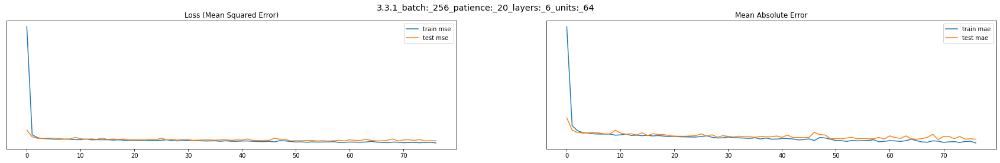

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_20_layers:_6...              13.163   
1  test:_3.3.1_batch:_256_patience:_20_layers:_6_...              15.633   
2  3.3.1_batch:_256_patience:_20_layers:_6_units:_64               2.469   

   mean_absolute_error  r2_score  e_v_score  
0                2.673    95.468     95.468  
1                2.922    94.668     94.668  
2                0.249     0.800      0.800  

Epoch 1: val_loss improved from inf to 0.07478, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.07478 to 0.03961, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_20_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.03961 to 0.02717, saving model to /content/drive/MyD

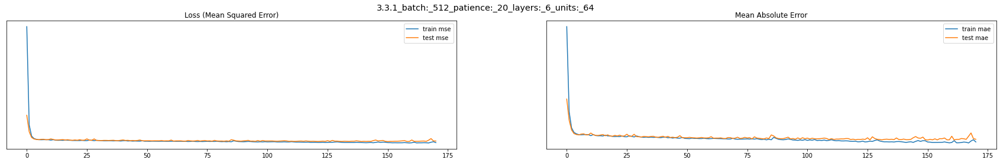

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_20_layers:_6...              12.625   
1  test:_3.3.1_batch:_512_patience:_20_layers:_6_...              15.777   
2  3.3.1_batch:_512_patience:_20_layers:_6_units:_64               3.152   

   mean_absolute_error  r2_score  e_v_score  
0                2.606    95.653     95.735  
1                2.913    94.618     94.698  
2                0.308     1.035      1.037  

Epoch 1: val_loss improved from inf to 0.03080, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.03080 to 0.02569, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.02569 to 0.02492, saving model to /content/drive/MyDri

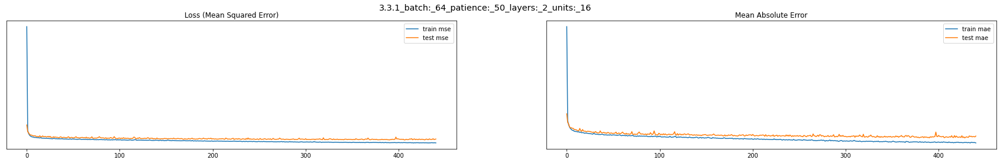

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_2_...              14.095   
1  test:_3.3.1_batch:_64_patience:_50_layers:_2_u...              16.263   
2   3.3.1_batch:_64_patience:_50_layers:_2_units:_16               2.167   

   mean_absolute_error  r2_score  e_v_score  
0                2.844    95.147     95.200  
1                3.043    94.453     94.516  
2                0.200     0.694      0.684  

Epoch 1: val_loss improved from inf to 0.07637, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.07637 to 0.02933, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.02933 to 0.02555, saving model to /content/drive/MyD

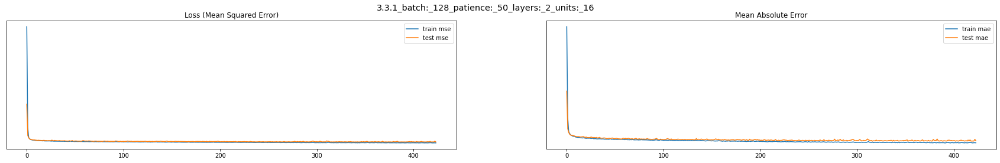

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_2...              14.377   
1  test:_3.3.1_batch:_128_patience:_50_layers:_2_...              15.630   
2  3.3.1_batch:_128_patience:_50_layers:_2_units:_16               1.253   

   mean_absolute_error  r2_score  e_v_score  
0                2.857    95.050     95.084  
1                2.996    94.668     94.698  
2                0.138     0.382      0.386  

Epoch 1: val_loss improved from inf to 0.25759, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.25759 to 0.10696, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.10696 to 0.03317, saving model to /content/drive/MyD

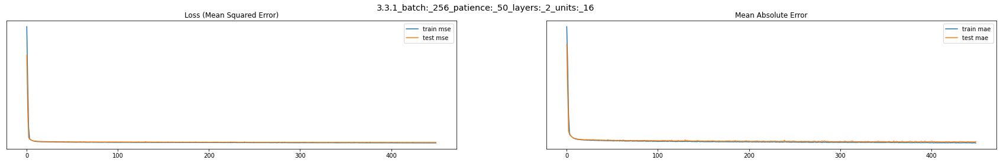

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_2...              14.729   
1  test:_3.3.1_batch:_256_patience:_50_layers:_2_...              16.026   
2  3.3.1_batch:_256_patience:_50_layers:_2_units:_16               1.297   

   mean_absolute_error  r2_score  e_v_score  
0                2.912    94.928     94.969  
1                3.036    94.533     94.574  
2                0.124     0.395      0.395  

Epoch 1: val_loss improved from inf to 0.27149, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_16.hdf5

Epoch 2: val_loss improved from 0.27149 to 0.18851, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_16.hdf5

Epoch 3: val_loss improved from 0.18851 to 0.11006, saving model to /content/drive/MyD

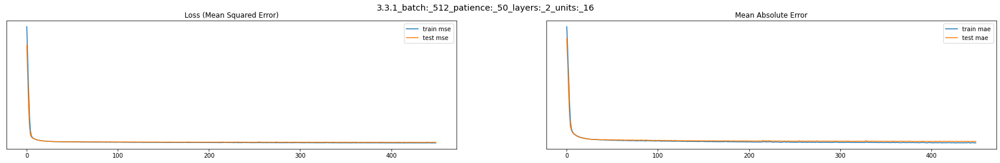

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_2...              15.166   
1  test:_3.3.1_batch:_512_patience:_50_layers:_2_...              16.379   
2  3.3.1_batch:_512_patience:_50_layers:_2_units:_16               1.212   

   mean_absolute_error  r2_score  e_v_score  
0                2.965    94.778     94.782  
1                3.096    94.413     94.419  
2                0.131     0.365      0.363  

Epoch 1: val_loss improved from inf to 0.02538, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.02538 to 0.02294, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.02294 to 0.02246, saving model to /content/drive/MyDri

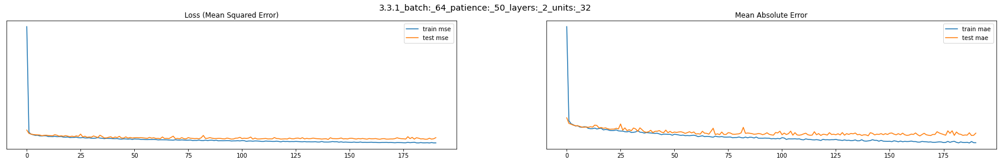

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_2_...              13.367   
1  test:_3.3.1_batch:_64_patience:_50_layers:_2_u...              16.009   
2   3.3.1_batch:_64_patience:_50_layers:_2_units:_32               2.642   

   mean_absolute_error  r2_score  e_v_score  
0                2.714    95.398     95.602  
1                2.976    94.539     94.752  
2                0.262     0.859      0.850  

Epoch 1: val_loss improved from inf to 0.02917, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.02917 to 0.02489, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.02489 to 0.02316, saving model to /content/drive/MyD

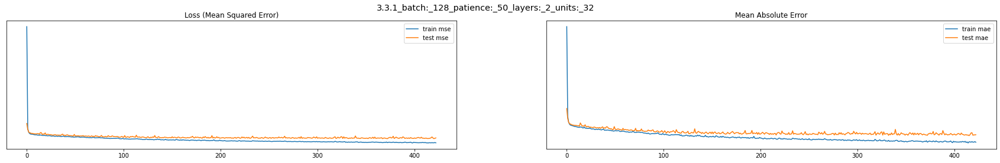

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_2...              12.459   
1  test:_3.3.1_batch:_128_patience:_50_layers:_2_...              15.267   
2  3.3.1_batch:_128_patience:_50_layers:_2_units:_32               2.808   

   mean_absolute_error  r2_score  e_v_score  
0                2.593    95.710     95.787  
1                2.895    94.792     94.873  
2                0.303     0.918      0.914  

Epoch 1: val_loss improved from inf to 0.14656, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.14656 to 0.04164, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.04164 to 0.02865, saving model to /content/drive/MyD

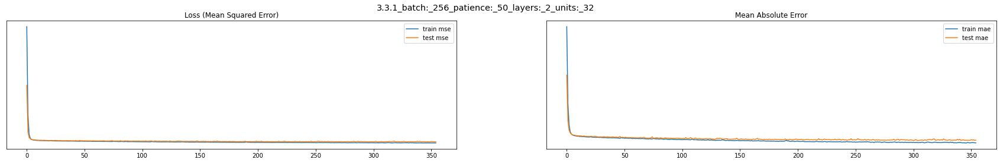

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_2...              12.933   
1  test:_3.3.1_batch:_256_patience:_50_layers:_2_...              15.318   
2  3.3.1_batch:_256_patience:_50_layers:_2_units:_32               2.384   

   mean_absolute_error  r2_score  e_v_score  
0                2.676    95.547     95.549  
1                2.914    94.775     94.777  
2                0.238     0.772      0.772  

Epoch 1: val_loss improved from inf to 0.25752, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_32.hdf5

Epoch 2: val_loss improved from 0.25752 to 0.10194, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_32.hdf5

Epoch 3: val_loss improved from 0.10194 to 0.03492, saving model to /content/drive/MyD

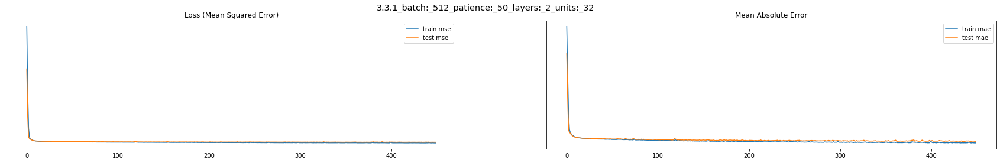

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_2...              13.519   
1  test:_3.3.1_batch:_512_patience:_50_layers:_2_...              15.586   
2  3.3.1_batch:_512_patience:_50_layers:_2_units:_32               2.067   

   mean_absolute_error  r2_score  e_v_score  
0                2.745    95.345     95.345  
1                2.929    94.684     94.684  
2                0.184     0.661      0.661  

Epoch 1: val_loss improved from inf to 0.02302, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02302 to 0.02267, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02267 to 0.02243, saving model to /content/drive/MyDri

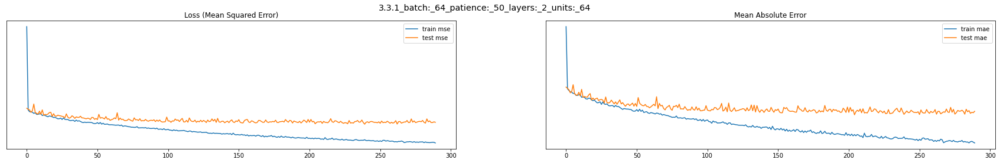

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_2_...               8.221   
1  test:_3.3.1_batch:_64_patience:_50_layers:_2_u...              14.544   
2   3.3.1_batch:_64_patience:_50_layers:_2_units:_64               6.323   

   mean_absolute_error  r2_score  e_v_score  
0                2.076    97.169     97.177  
1                2.815    95.039     95.052  
2                0.739     2.130      2.125  

Epoch 1: val_loss improved from inf to 0.02488, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02488 to 0.02269, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02269 to 0.02254, saving model to /content/drive/MyD

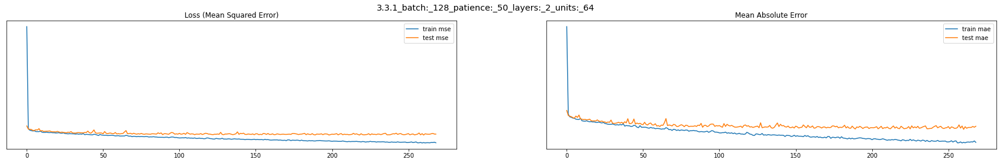

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_2...              10.331   
1  test:_3.3.1_batch:_128_patience:_50_layers:_2_...              15.370   
2  3.3.1_batch:_128_patience:_50_layers:_2_units:_64               5.039   

   mean_absolute_error  r2_score  e_v_score  
0                2.395    96.443     96.460  
1                2.924    94.757     94.777  
2                0.529     1.686      1.683  

Epoch 1: val_loss improved from inf to 0.02803, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.02803 to 0.02416, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02416 to 0.02284, saving model to /content/drive/MyD

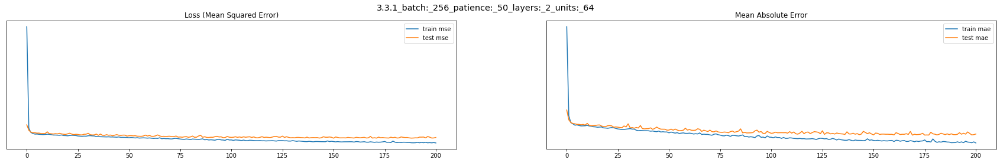

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_2...              12.067   
1  test:_3.3.1_batch:_256_patience:_50_layers:_2_...              15.314   
2  3.3.1_batch:_256_patience:_50_layers:_2_units:_64               3.248   

   mean_absolute_error  r2_score  e_v_score  
0                2.569    95.845     95.873  
1                2.898    94.776     94.793  
2                0.329     1.069      1.080  

Epoch 1: val_loss improved from inf to 0.04564, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_64.hdf5

Epoch 2: val_loss improved from 0.04564 to 0.02727, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_2_units:_64.hdf5

Epoch 3: val_loss improved from 0.02727 to 0.02435, saving model to /content/drive/MyD

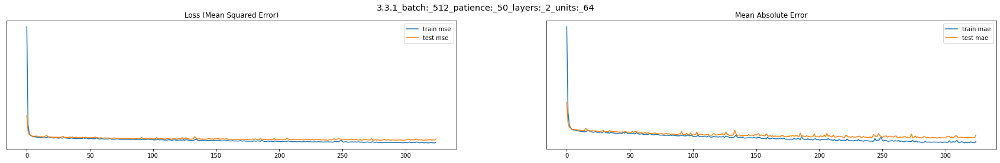

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_2...              13.100   
1  test:_3.3.1_batch:_512_patience:_50_layers:_2_...              15.774   
2  3.3.1_batch:_512_patience:_50_layers:_2_units:_64               2.673   

   mean_absolute_error  r2_score  e_v_score  
0                2.741    95.489     95.700  
1                3.000    94.619     94.828  
2                0.259     0.870      0.872  

Epoch 1: val_loss improved from inf to 0.04177, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.04177 to 0.02743, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.02743 to 0.02505, saving model to /content/drive/MyDri

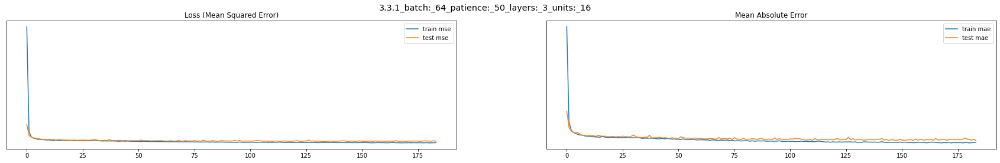

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_3_...              13.992   
1  test:_3.3.1_batch:_64_patience:_50_layers:_3_u...              15.899   
2   3.3.1_batch:_64_patience:_50_layers:_3_units:_16               1.908   

   mean_absolute_error  r2_score  e_v_score  
0                2.794    95.182     95.194  
1                2.965    94.577     94.588  
2                0.171     0.605      0.606  

Epoch 1: val_loss improved from inf to 0.08713, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.08713 to 0.03131, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.03131 to 0.02669, saving model to /content/drive/MyD

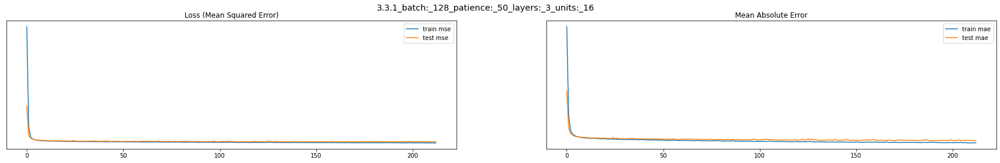

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_3...              14.271   
1  test:_3.3.1_batch:_128_patience:_50_layers:_3_...              16.075   
2  3.3.1_batch:_128_patience:_50_layers:_3_units:_16               1.803   

   mean_absolute_error  r2_score  e_v_score  
0                2.838    95.086     95.115  
1                3.018    94.517     94.548  
2                0.180     0.569      0.567  

Epoch 1: val_loss improved from inf to 0.18152, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.18152 to 0.05759, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.05759 to 0.03193, saving model to /content/drive/MyD

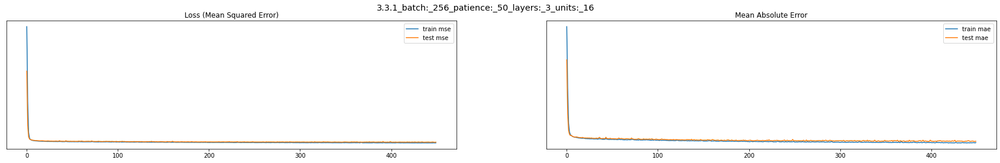

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_3...              14.682   
1  test:_3.3.1_batch:_256_patience:_50_layers:_3_...              16.072   
2  3.3.1_batch:_256_patience:_50_layers:_3_units:_16               1.390   

   mean_absolute_error  r2_score  e_v_score  
0                2.876    94.945     94.979  
1                3.011    94.518     94.550  
2                0.136     0.427      0.429  

Epoch 1: val_loss improved from inf to 0.22909, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_16.hdf5

Epoch 2: val_loss improved from 0.22909 to 0.12382, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_16.hdf5

Epoch 3: val_loss improved from 0.12382 to 0.06487, saving model to /content/drive/MyD

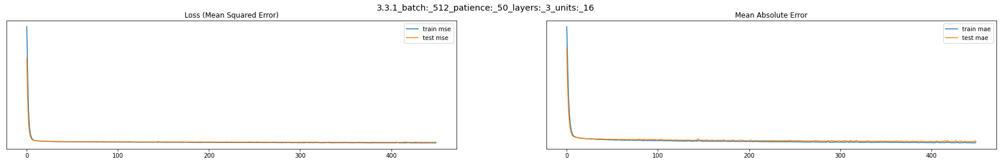

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_3...              14.896   
1  test:_3.3.1_batch:_512_patience:_50_layers:_3_...              16.230   
2  3.3.1_batch:_512_patience:_50_layers:_3_units:_16               1.334   

   mean_absolute_error  r2_score  e_v_score  
0                2.929    94.871     94.967  
1                3.053    94.464     94.563  
2                0.123     0.407      0.404  

Epoch 1: val_loss improved from inf to 0.02527, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.02527 to 0.02289, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02289 to 0.02254, saving model to /content/drive/MyDri

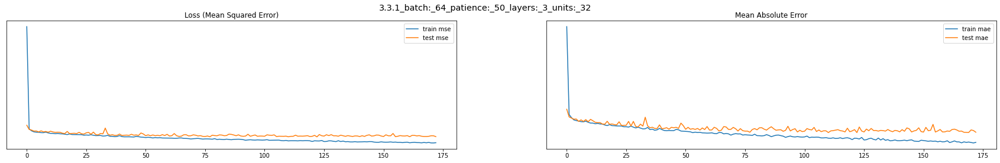

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_3_...              11.662   
1  test:_3.3.1_batch:_64_patience:_50_layers:_3_u...              15.153   
2   3.3.1_batch:_64_patience:_50_layers:_3_units:_32               3.490   

   mean_absolute_error  r2_score  e_v_score  
0                2.527    95.984     95.988  
1                2.887    94.831     94.838  
2                0.360     1.153      1.150  

Epoch 1: val_loss improved from inf to 0.02924, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.02924 to 0.02448, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02448 to 0.02315, saving model to /content/drive/MyD

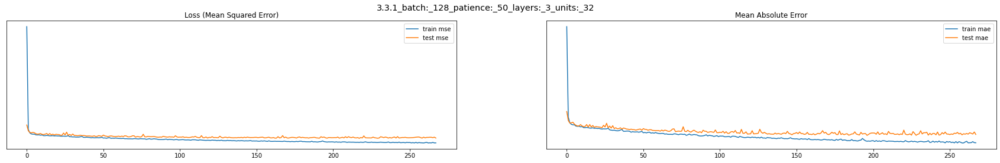

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_3...              11.249   
1  test:_3.3.1_batch:_128_patience:_50_layers:_3_...              14.964   
2  3.3.1_batch:_128_patience:_50_layers:_3_units:_32               3.715   

   mean_absolute_error  r2_score  e_v_score  
0                2.465    96.127     96.134  
1                2.850    94.895     94.897  
2                0.385     1.232      1.237  

Epoch 1: val_loss improved from inf to 0.07807, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.07807 to 0.02792, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.02792 to 0.02496, saving model to /content/drive/MyD

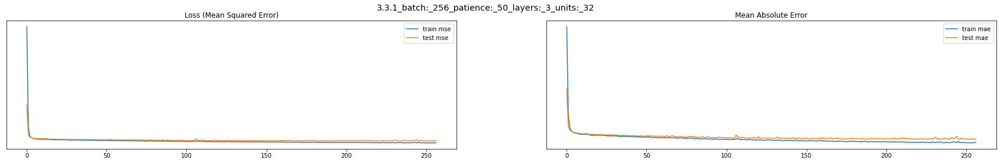

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_3...              12.026   
1  test:_3.3.1_batch:_256_patience:_50_layers:_3_...              15.035   
2  3.3.1_batch:_256_patience:_50_layers:_3_units:_32               3.008   

   mean_absolute_error  r2_score  e_v_score  
0                2.546    95.859     95.890  
1                2.844    94.871     94.901  
2                0.297     0.988      0.989  

Epoch 1: val_loss improved from inf to 0.21306, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_32.hdf5

Epoch 2: val_loss improved from 0.21306 to 0.07309, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_32.hdf5

Epoch 3: val_loss improved from 0.07309 to 0.04464, saving model to /content/drive/MyD

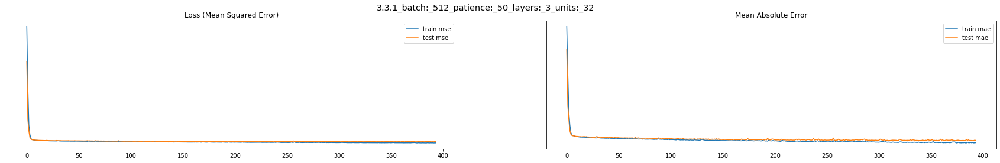

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_3...              12.779   
1  test:_3.3.1_batch:_512_patience:_50_layers:_3_...              15.288   
2  3.3.1_batch:_512_patience:_50_layers:_3_units:_32               2.509   

   mean_absolute_error  r2_score  e_v_score  
0                2.661    95.600     95.610  
1                2.898    94.785     94.799  
2                0.236     0.815      0.811  

Epoch 1: val_loss improved from inf to 0.02428, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_64.hdf5

Epoch 2: val_loss did not improve from 0.02428

Epoch 3: val_loss improved from 0.02428 to 0.02173, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_3_units:_64.hdf5

Epoch 4: val_loss improved from 0.02173 

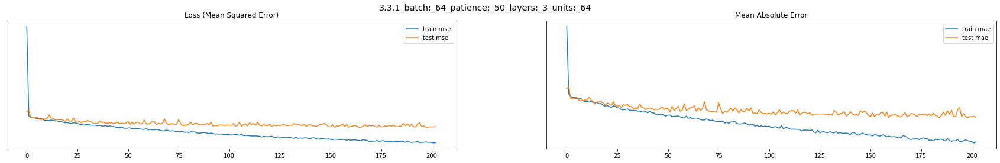

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_3_...               8.480   
1  test:_3.3.1_batch:_64_patience:_50_layers:_3_u...              14.418   
2   3.3.1_batch:_64_patience:_50_layers:_3_units:_64               5.939   

   mean_absolute_error  r2_score  e_v_score  
0                2.110    97.080     97.121  
1                2.758    95.082     95.113  
2                0.648     1.998      2.008  

Epoch 1: val_loss improved from inf to 0.02440, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.02440 to 0.02387, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02387 to 0.02329, saving model to /content/drive/MyD

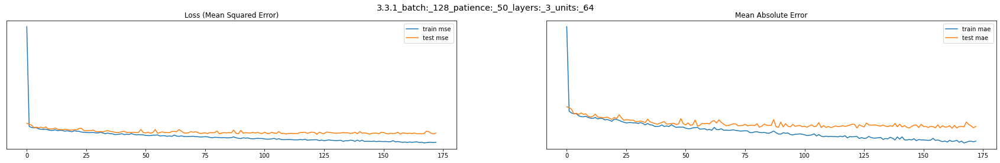

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_3...              10.400   
1  test:_3.3.1_batch:_128_patience:_50_layers:_3_...              15.068   
2  3.3.1_batch:_128_patience:_50_layers:_3_units:_64               4.668   

   mean_absolute_error  r2_score  e_v_score  
0                2.363    96.419     96.421  
1                2.861    94.860     94.862  
2                0.498     1.559      1.559  

Epoch 1: val_loss improved from inf to 0.04736, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.04736 to 0.02524, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.02524 to 0.02337, saving model to /content/drive/MyD

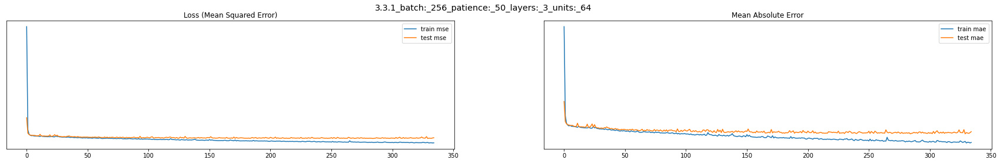

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_3...               9.254   
1  test:_3.3.1_batch:_256_patience:_50_layers:_3_...              15.085   
2  3.3.1_batch:_256_patience:_50_layers:_3_units:_64               5.831   

   mean_absolute_error  r2_score  e_v_score  
0                2.253    96.814     96.939  
1                2.876    94.854     94.958  
2                0.623     1.960      1.981  

Epoch 1: val_loss improved from inf to 0.05767, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_64.hdf5

Epoch 2: val_loss improved from 0.05767 to 0.03020, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_3_units:_64.hdf5

Epoch 3: val_loss improved from 0.03020 to 0.02566, saving model to /content/drive/MyD

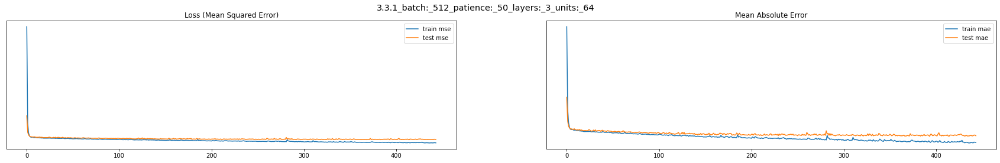

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_3...               9.863   
1  test:_3.3.1_batch:_512_patience:_50_layers:_3_...              14.691   
2  3.3.1_batch:_512_patience:_50_layers:_3_units:_64               4.829   

   mean_absolute_error  r2_score  e_v_score  
0                2.286    96.604     96.604  
1                2.820    94.989     94.989  
2                0.534     1.615      1.615  

Epoch 1: val_loss improved from inf to 0.03361, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.03361 to 0.02543, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.02543 to 0.02343, saving model to /content/drive/MyDri

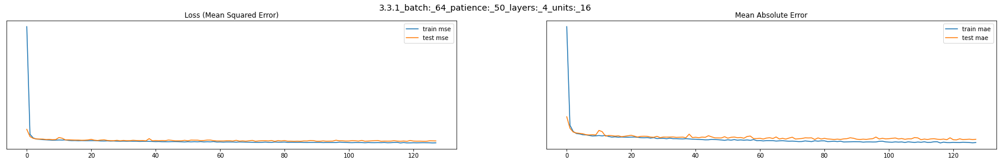

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_4_...              14.718   
1  test:_3.3.1_batch:_64_patience:_50_layers:_4_u...              16.516   
2   3.3.1_batch:_64_patience:_50_layers:_4_units:_16               1.798   

   mean_absolute_error  r2_score  e_v_score  
0                2.883    94.932     95.013  
1                3.045    94.366     94.439  
2                0.162     0.566      0.574  

Epoch 1: val_loss improved from inf to 0.08642, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.08642 to 0.03349, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.03349 to 0.02903, saving model to /content/drive/MyD

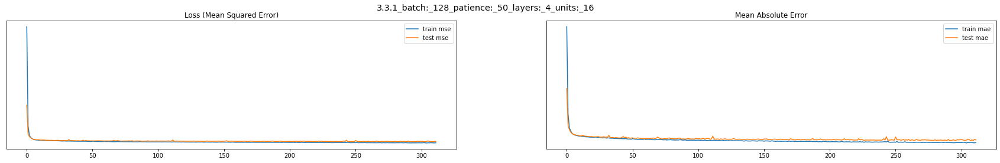

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_4...              13.869   
1  test:_3.3.1_batch:_128_patience:_50_layers:_4_...              15.990   
2  3.3.1_batch:_128_patience:_50_layers:_4_units:_16               2.121   

   mean_absolute_error  r2_score  e_v_score  
0                2.797    95.225     95.240  
1                2.999    94.546     94.563  
2                0.202     0.679      0.677  

Epoch 1: val_loss improved from inf to 0.21650, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.21650 to 0.11853, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.11853 to 0.04537, saving model to /content/drive/MyD

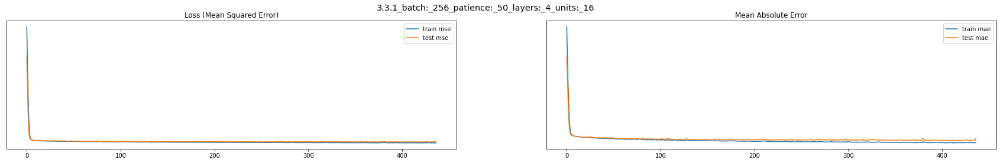

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_4...              14.848   
1  test:_3.3.1_batch:_256_patience:_50_layers:_4_...              16.836   
2  3.3.1_batch:_256_patience:_50_layers:_4_units:_16               1.988   

   mean_absolute_error  r2_score  e_v_score  
0                2.976    94.888     95.314  
1                3.124    94.257     94.650  
2                0.148     0.631      0.664  

Epoch 1: val_loss improved from inf to 0.27497, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_16.hdf5

Epoch 2: val_loss improved from 0.27497 to 0.16237, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_16.hdf5

Epoch 3: val_loss improved from 0.16237 to 0.07452, saving model to /content/drive/MyD

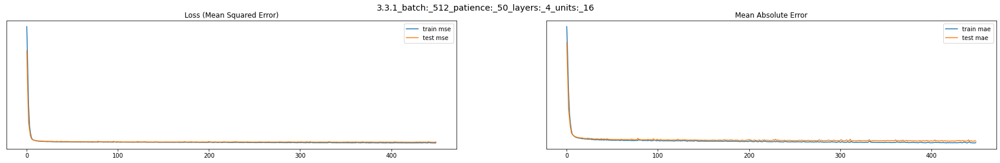

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_4...              14.751   
1  test:_3.3.1_batch:_512_patience:_50_layers:_4_...              16.505   
2  3.3.1_batch:_512_patience:_50_layers:_4_units:_16               1.754   

   mean_absolute_error  r2_score  e_v_score  
0                2.884    94.921     94.929  
1                3.068    94.370     94.380  
2                0.184     0.551      0.549  

Epoch 1: val_loss improved from inf to 0.02652, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.02652 to 0.02357, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.02357 to 0.02333, saving model to /content/drive/MyDri

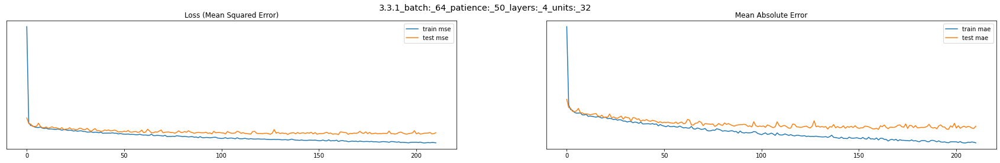

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_4_...              10.684   
1  test:_3.3.1_batch:_64_patience:_50_layers:_4_u...              15.130   
2   3.3.1_batch:_64_patience:_50_layers:_4_units:_32               4.446   

   mean_absolute_error  r2_score  e_v_score  
0                2.397    96.321     96.451  
1                2.863    94.839     94.994  
2                0.466     1.482      1.457  

Epoch 1: val_loss improved from inf to 0.03233, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.03233 to 0.02446, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.02446 to 0.02299, saving model to /content/drive/MyD

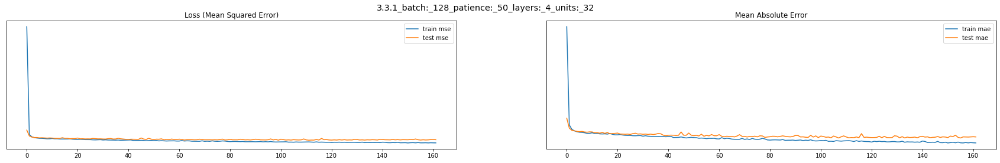

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_4...              12.173   
1  test:_3.3.1_batch:_128_patience:_50_layers:_4_...              15.687   
2  3.3.1_batch:_128_patience:_50_layers:_4_units:_32               3.514   

   mean_absolute_error  r2_score  e_v_score  
0                2.592    95.809     95.809  
1                2.931    94.649     94.651  
2                0.340     1.160      1.158  

Epoch 1: val_loss improved from inf to 0.08019, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.08019 to 0.02979, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.02979 to 0.02454, saving model to /content/drive/MyD

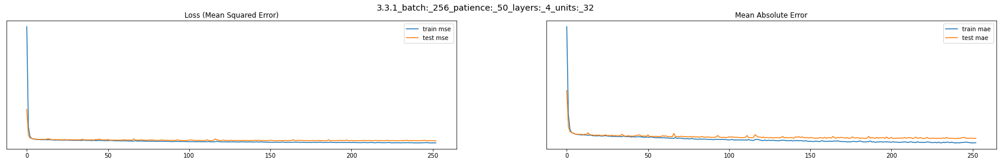

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_4...               11.46   
1  test:_3.3.1_batch:_256_patience:_50_layers:_4_...               15.20   
2  3.3.1_batch:_256_patience:_50_layers:_4_units:_32                3.74   

   mean_absolute_error  r2_score  e_v_score  
0                2.493    96.054     96.057  
1                2.892    94.815     94.820  
2                0.399     1.239      1.237  

Epoch 1: val_loss improved from inf to 0.16358, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_32.hdf5

Epoch 2: val_loss improved from 0.16358 to 0.05558, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_32.hdf5

Epoch 3: val_loss improved from 0.05558 to 0.03232, saving model to /content/drive/MyD

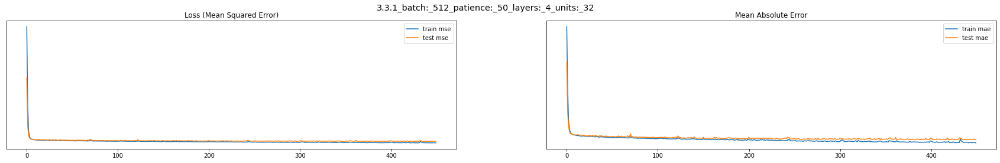

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_4...              12.267   
1  test:_3.3.1_batch:_512_patience:_50_layers:_4_...              15.245   
2  3.3.1_batch:_512_patience:_50_layers:_4_units:_32               2.979   

   mean_absolute_error  r2_score  e_v_score  
0                2.602    95.776     95.837  
1                2.896    94.800     94.860  
2                0.294     0.976      0.977  

Epoch 1: val_loss improved from inf to 0.02362, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.02362 to 0.02264, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.02264 to 0.02191, saving model to /content/drive/MyDri

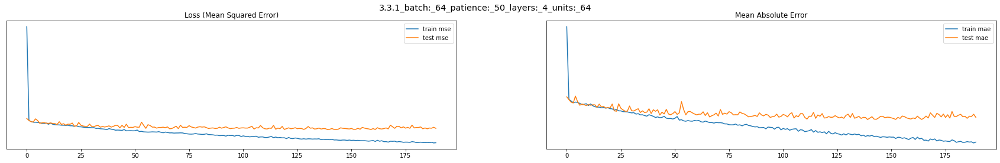

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_4_...               8.063   
1  test:_3.3.1_batch:_64_patience:_50_layers:_4_u...              14.793   
2   3.3.1_batch:_64_patience:_50_layers:_4_units:_64               6.730   

   mean_absolute_error  r2_score  e_v_score  
0                2.061    97.224     97.224  
1                2.806    94.954     94.955  
2                0.745     2.270      2.269  

Epoch 1: val_loss improved from inf to 0.02547, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.02547 to 0.02295, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_4_units:_64.hdf5

Epoch 3: val_loss did not improve from 0.02295

Epoch 4: val_loss improved from 0.0229

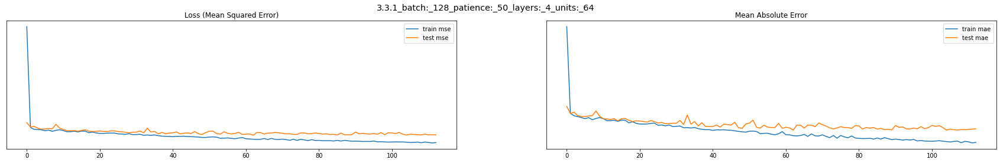

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_4...              11.075   
1  test:_3.3.1_batch:_128_patience:_50_layers:_4_...              14.919   
2  3.3.1_batch:_128_patience:_50_layers:_4_units:_64               3.844   

   mean_absolute_error  r2_score  e_v_score  
0                2.441    96.187      96.20  
1                2.862    94.911      94.93  
2                0.421     1.276       1.27  

Epoch 1: val_loss improved from inf to 0.03605, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.03605 to 0.02417, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.02417 to 0.02324, saving model to /content/drive/MyD

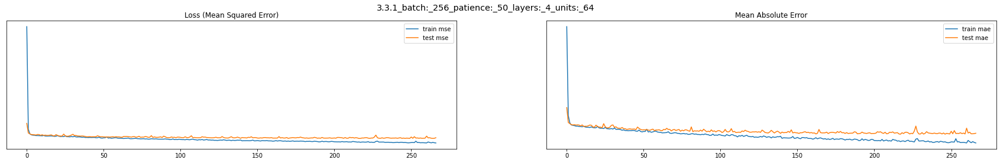

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_4...               9.551   
1  test:_3.3.1_batch:_256_patience:_50_layers:_4_...              14.792   
2  3.3.1_batch:_256_patience:_50_layers:_4_units:_64               5.241   

   mean_absolute_error  r2_score  e_v_score  
0                2.234    96.711     96.769  
1                2.788    94.954     95.005  
2                0.554     1.757      1.764  

Epoch 1: val_loss improved from inf to 0.06733, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_64.hdf5

Epoch 2: val_loss improved from 0.06733 to 0.03430, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_4_units:_64.hdf5

Epoch 3: val_loss improved from 0.03430 to 0.02649, saving model to /content/drive/MyD

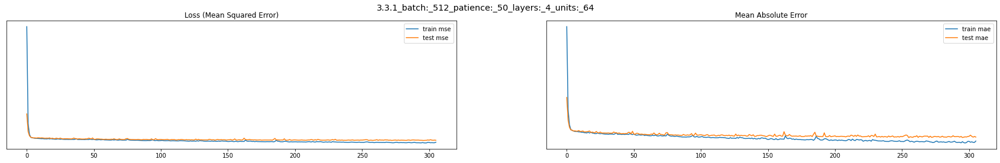

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_4...              10.650   
1  test:_3.3.1_batch:_512_patience:_50_layers:_4_...              14.587   
2  3.3.1_batch:_512_patience:_50_layers:_4_units:_64               3.937   

   mean_absolute_error  r2_score  e_v_score  
0                2.377    96.333     96.376  
1                2.813    95.024     95.064  
2                0.436     1.309      1.312  

Epoch 1: val_loss improved from inf to 0.03224, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.03224 to 0.02523, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.02523 to 0.02366, saving model to /content/drive/MyDri

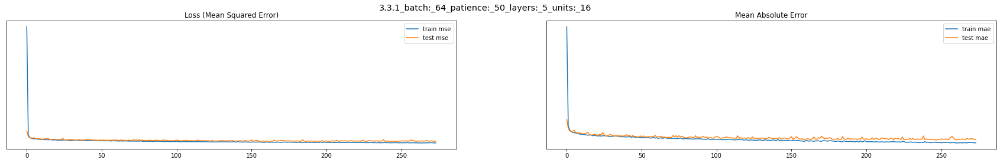

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_5_...              13.876   
1  test:_3.3.1_batch:_64_patience:_50_layers:_5_u...              15.847   
2   3.3.1_batch:_64_patience:_50_layers:_5_units:_16               1.971   

   mean_absolute_error  r2_score  e_v_score  
0                2.809    95.222     95.236  
1                3.003    94.594     94.605  
2                0.194     0.628      0.631  

Epoch 1: val_loss improved from inf to 0.04666, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.04666 to 0.02796, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.02796 to 0.02468, saving model to /content/drive/MyD

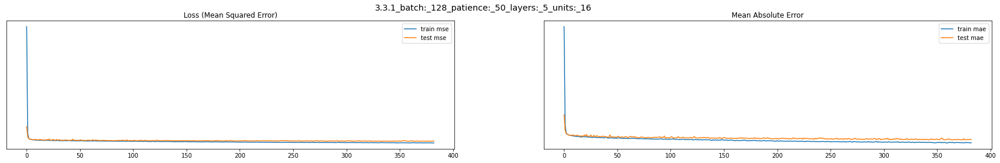

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_5...              13.314   
1  test:_3.3.1_batch:_128_patience:_50_layers:_5_...              16.174   
2  3.3.1_batch:_128_patience:_50_layers:_5_units:_16               2.860   

   mean_absolute_error  r2_score  e_v_score  
0                2.755    95.416     95.435  
1                3.017    94.483     94.497  
2                0.263     0.933      0.938  

Epoch 1: val_loss improved from inf to 0.16196, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.16196 to 0.08686, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.08686 to 0.04585, saving model to /content/drive/MyD

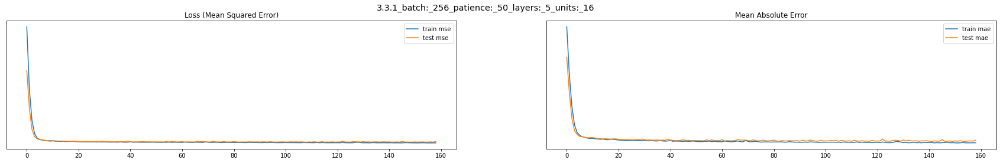

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_5...              15.950   
1  test:_3.3.1_batch:_256_patience:_50_layers:_5_...              17.474   
2  3.3.1_batch:_256_patience:_50_layers:_5_units:_16               1.524   

   mean_absolute_error  r2_score  e_v_score  
0                3.020    94.508     94.801  
1                3.171    94.040     94.334  
2                0.151     0.468      0.467  

Epoch 1: val_loss improved from inf to 0.32652, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_16.hdf5

Epoch 2: val_loss improved from 0.32652 to 0.24861, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_16.hdf5

Epoch 3: val_loss improved from 0.24861 to 0.14298, saving model to /content/drive/MyD

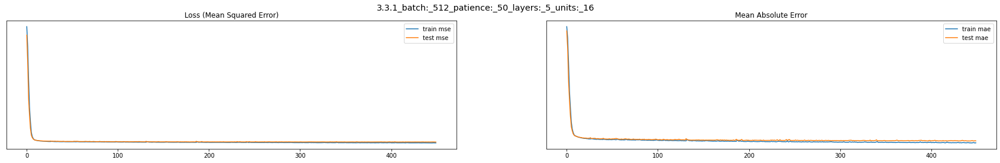

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_5...              13.991   
1  test:_3.3.1_batch:_512_patience:_50_layers:_5_...              16.164   
2  3.3.1_batch:_512_patience:_50_layers:_5_units:_16               2.174   

   mean_absolute_error  r2_score  e_v_score  
0                2.820    95.183     95.194  
1                3.024    94.486     94.493  
2                0.204     0.697      0.701  

Epoch 1: val_loss improved from inf to 0.02615, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.02615 to 0.02263, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02263 to 0.02255, saving model to /content/drive/MyDri

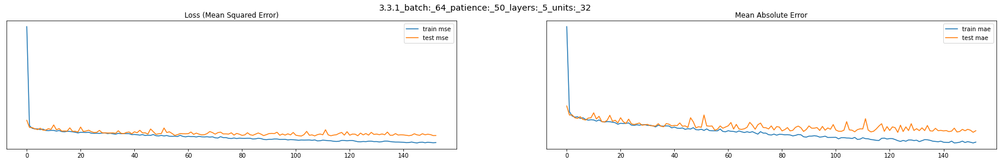

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_5_...              11.454   
1  test:_3.3.1_batch:_64_patience:_50_layers:_5_u...              15.001   
2   3.3.1_batch:_64_patience:_50_layers:_5_units:_32               3.547   

   mean_absolute_error  r2_score  e_v_score  
0                2.523    96.056     96.059  
1                2.899    94.883     94.886  
2                0.377     1.173      1.173  

Epoch 1: val_loss improved from inf to 0.02757, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.02757 to 0.02380, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.02380 to 0.02284, saving model to /content/drive/MyD

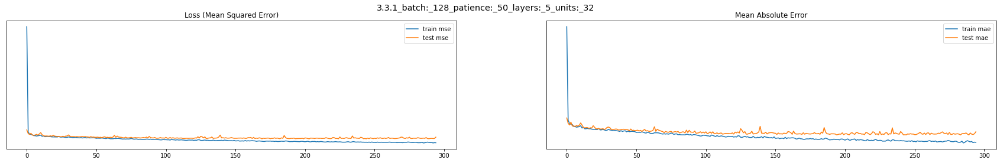

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_5...              12.433   
1  test:_3.3.1_batch:_128_patience:_50_layers:_5_...              16.212   
2  3.3.1_batch:_128_patience:_50_layers:_5_units:_32               3.779   

   mean_absolute_error  r2_score  e_v_score  
0                2.658    95.719     95.888  
1                2.990    94.470     94.636  
2                0.331     1.249      1.252  

Epoch 1: val_loss improved from inf to 0.07285, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.07285 to 0.03258, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.03258 to 0.02504, saving model to /content/drive/MyD

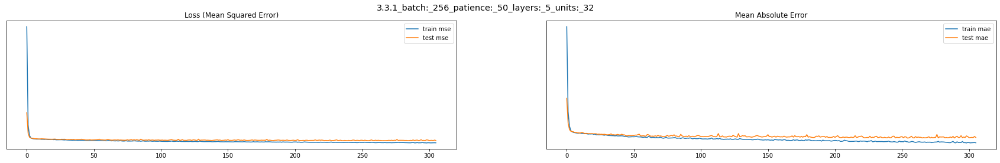

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_5...              11.078   
1  test:_3.3.1_batch:_256_patience:_50_layers:_5_...              14.986   
2  3.3.1_batch:_256_patience:_50_layers:_5_units:_32               3.908   

   mean_absolute_error  r2_score  e_v_score  
0                2.441    96.186     96.251  
1                2.859    94.888     94.956  
2                0.418     1.298      1.295  

Epoch 1: val_loss improved from inf to 0.26150, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_32.hdf5

Epoch 2: val_loss improved from 0.26150 to 0.06617, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_32.hdf5

Epoch 3: val_loss improved from 0.06617 to 0.04128, saving model to /content/drive/MyD

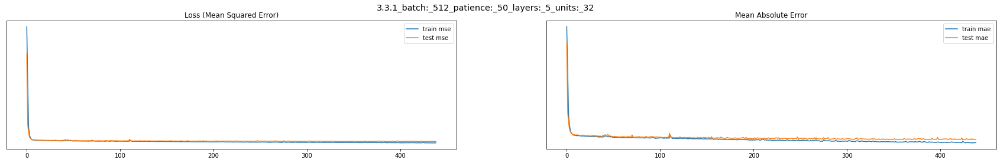

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_5...              11.765   
1  test:_3.3.1_batch:_512_patience:_50_layers:_5_...              15.200   
2  3.3.1_batch:_512_patience:_50_layers:_5_units:_32               3.435   

   mean_absolute_error  r2_score  e_v_score  
0                2.535    95.949     95.961  
1                2.887    94.815     94.826  
2                0.353     1.134      1.135  

Epoch 1: val_loss improved from inf to 0.02639, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.02639 to 0.02476, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02476 to 0.02173, saving model to /content/drive/MyDri

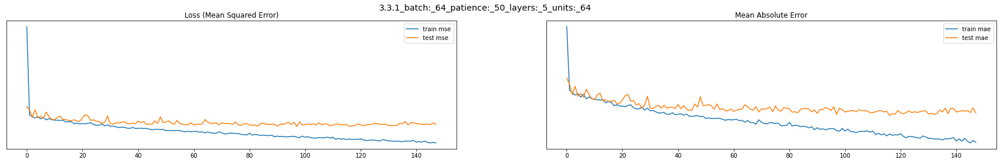

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_5_...               8.073   
1  test:_3.3.1_batch:_64_patience:_50_layers:_5_u...              15.036   
2   3.3.1_batch:_64_patience:_50_layers:_5_units:_64               6.964   

   mean_absolute_error  r2_score  e_v_score  
0                2.003    97.220     97.243  
1                2.797    94.871     94.890  
2                0.794     2.349      2.353  

Epoch 1: val_loss improved from inf to 0.02633, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.02633 to 0.02287, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02287 to 0.02210, saving model to /content/drive/MyD

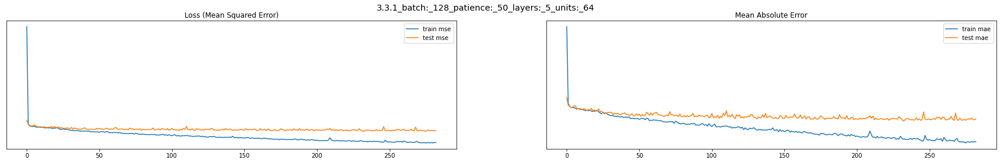

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_5...               6.081   
1  test:_3.3.1_batch:_128_patience:_50_layers:_5_...              14.463   
2  3.3.1_batch:_128_patience:_50_layers:_5_units:_64               8.382   

   mean_absolute_error  r2_score  e_v_score  
0                1.737    97.906     97.906  
1                2.737    95.066     95.067  
2                1.000     2.840      2.839  

Epoch 1: val_loss improved from inf to 0.03715, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.03715 to 0.02385, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.02385 to 0.02243, saving model to /content/drive/MyD

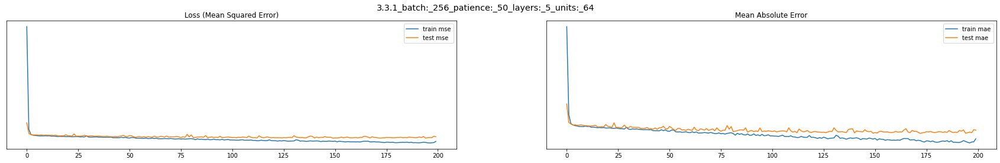

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_5...              10.407   
1  test:_3.3.1_batch:_256_patience:_50_layers:_5_...              15.979   
2  3.3.1_batch:_256_patience:_50_layers:_5_units:_64               5.573   

   mean_absolute_error  r2_score  e_v_score  
0                2.350    96.417     96.707  
1                2.951    94.549     94.875  
2                0.600     1.868      1.832  

Epoch 1: val_loss improved from inf to 0.06810, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_64.hdf5

Epoch 2: val_loss improved from 0.06810 to 0.03869, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_5_units:_64.hdf5

Epoch 3: val_loss improved from 0.03869 to 0.02770, saving model to /content/drive/MyD

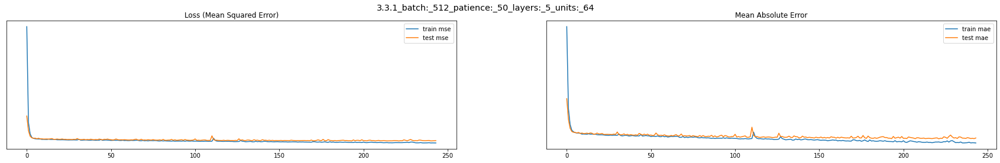

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_5...              11.376   
1  test:_3.3.1_batch:_512_patience:_50_layers:_5_...              15.283   
2  3.3.1_batch:_512_patience:_50_layers:_5_units:_64               3.907   

   mean_absolute_error  r2_score  e_v_score  
0                2.486    96.083     96.196  
1                2.896    94.787     94.912  
2                0.410     1.296      1.284  

Epoch 1: val_loss improved from inf to 0.03958, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.03958 to 0.02511, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.02511 to 0.02417, saving model to /content/drive/MyDri

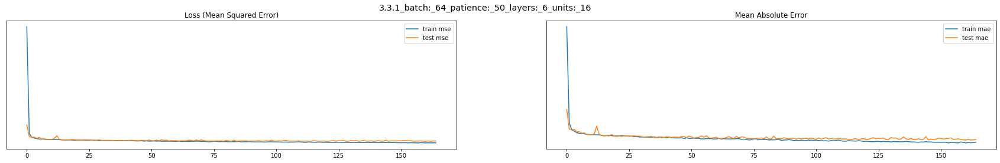

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_6_...              13.549   
1  test:_3.3.1_batch:_64_patience:_50_layers:_6_u...              15.791   
2   3.3.1_batch:_64_patience:_50_layers:_6_units:_16               2.242   

   mean_absolute_error  r2_score  e_v_score  
0                2.746    95.335     95.347  
1                2.961    94.613     94.632  
2                0.214     0.722      0.715  

Epoch 1: val_loss improved from inf to 0.09544, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.09544 to 0.02712, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.02712 to 0.02342, saving model to /content/drive/MyD

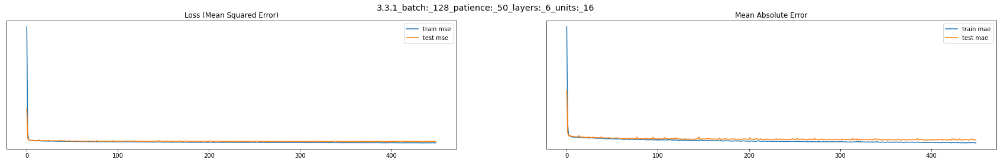

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_6...              13.138   
1  test:_3.3.1_batch:_128_patience:_50_layers:_6_...              16.008   
2  3.3.1_batch:_128_patience:_50_layers:_6_units:_16               2.870   

   mean_absolute_error  r2_score  e_v_score  
0                2.658    95.476     95.494  
1                2.952    94.539     94.558  
2                0.293     0.937      0.936  

Epoch 1: val_loss improved from inf to 0.29649, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.29649 to 0.08317, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.08317 to 0.03619, saving model to /content/drive/MyD

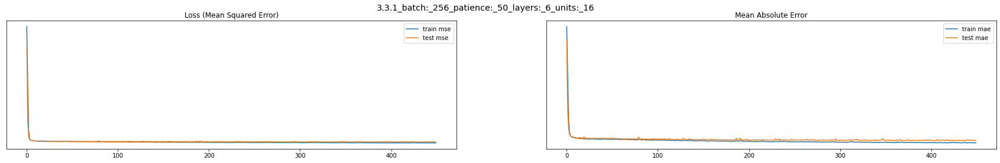

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_6...              13.031   
1  test:_3.3.1_batch:_256_patience:_50_layers:_6_...              15.646   
2  3.3.1_batch:_256_patience:_50_layers:_6_units:_16               2.615   

   mean_absolute_error  r2_score  e_v_score  
0                2.691    95.513     95.514  
1                2.964    94.663     94.665  
2                0.273     0.850      0.849  

Epoch 1: val_loss improved from inf to 0.32278, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_16.hdf5

Epoch 2: val_loss improved from 0.32278 to 0.24477, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_16.hdf5

Epoch 3: val_loss improved from 0.24477 to 0.14594, saving model to /content/drive/MyD

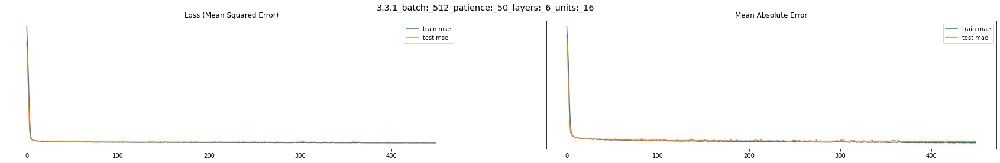

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_6...              14.709   
1  test:_3.3.1_batch:_512_patience:_50_layers:_6_...              16.237   
2  3.3.1_batch:_512_patience:_50_layers:_6_units:_16               1.528   

   mean_absolute_error  r2_score  e_v_score  
0                2.882    94.935     94.945  
1                3.023    94.462     94.472  
2                0.142     0.473      0.473  

Epoch 1: val_loss improved from inf to 0.02343, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_32.hdf5

Epoch 2: val_loss did not improve from 0.02343

Epoch 3: val_loss improved from 0.02343 to 0.02228, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_32.hdf5

Epoch 4: val_loss did not improve from 0

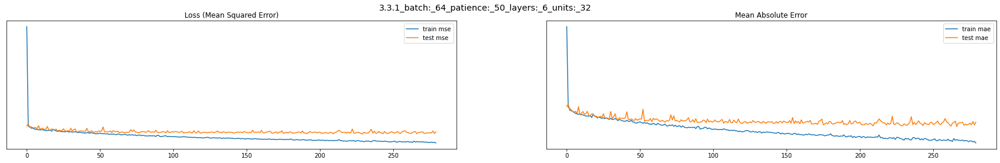

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_6_...               9.800   
1  test:_3.3.1_batch:_64_patience:_50_layers:_6_u...              15.617   
2   3.3.1_batch:_64_patience:_50_layers:_6_units:_32               5.818   

   mean_absolute_error  r2_score  e_v_score  
0                2.263    96.626     96.808  
1                2.908    94.673     94.890  
2                0.644     1.953      1.918  

Epoch 1: val_loss improved from inf to 0.04665, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.04665 to 0.02443, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.02443 to 0.02265, saving model to /content/drive/MyD

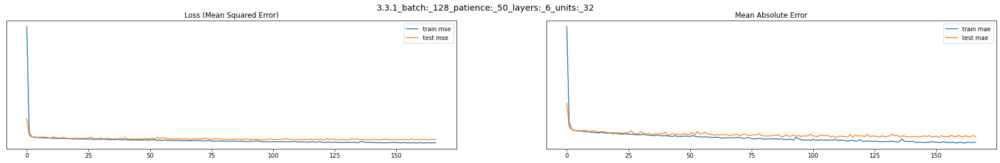

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_6...              11.830   
1  test:_3.3.1_batch:_128_patience:_50_layers:_6_...              15.580   
2  3.3.1_batch:_128_patience:_50_layers:_6_units:_32               3.749   

   mean_absolute_error  r2_score  e_v_score  
0                2.529    95.927     95.980  
1                2.883    94.686     94.746  
2                0.354     1.241      1.234  

Epoch 1: val_loss improved from inf to 0.13423, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.13423 to 0.03806, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.03806 to 0.02581, saving model to /content/drive/MyD

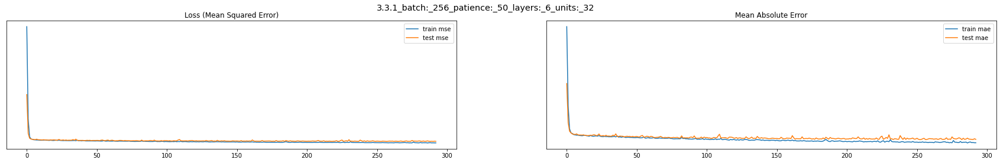

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_6...              11.061   
1  test:_3.3.1_batch:_256_patience:_50_layers:_6_...              14.626   
2  3.3.1_batch:_256_patience:_50_layers:_6_units:_32               3.565   

   mean_absolute_error  r2_score  e_v_score  
0                2.459    96.191     96.192  
1                2.815    95.011     95.011  
2                0.356     1.180      1.181  

Epoch 1: val_loss improved from inf to 0.21303, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_32.hdf5

Epoch 2: val_loss improved from 0.21303 to 0.05483, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_32.hdf5

Epoch 3: val_loss improved from 0.05483 to 0.03832, saving model to /content/drive/MyD

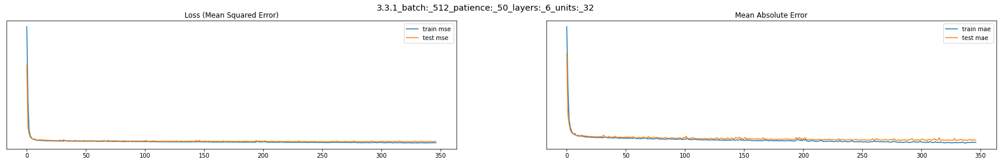

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_6...              12.871   
1  test:_3.3.1_batch:_512_patience:_50_layers:_6_...              15.650   
2  3.3.1_batch:_512_patience:_50_layers:_6_units:_32               2.779   

   mean_absolute_error  r2_score  e_v_score  
0                2.652    95.568     95.741  
1                2.905    94.662     94.825  
2                0.253     0.906      0.916  

Epoch 1: val_loss improved from inf to 0.02561, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.02561 to 0.02393, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_64_patience:_50_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02393 to 0.02374, saving model to /content/drive/MyDri

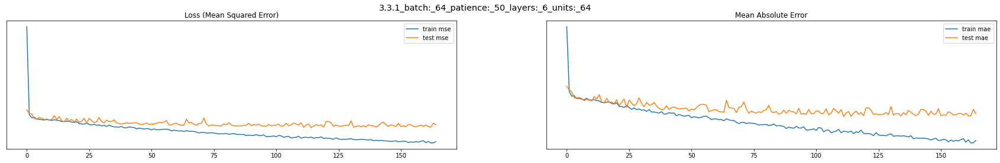

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_64_patience:_50_layers:_6_...               8.055   
1  test:_3.3.1_batch:_64_patience:_50_layers:_6_u...              15.012   
2   3.3.1_batch:_64_patience:_50_layers:_6_units:_64               6.957   

   mean_absolute_error  r2_score  e_v_score  
0                2.016    97.227     97.240  
1                2.801    94.879     94.904  
2                0.785     2.348      2.336  

Epoch 1: val_loss improved from inf to 0.02441, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.02441 to 0.02179, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_128_patience:_50_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02179 to 0.02173, saving model to /content/drive/MyD

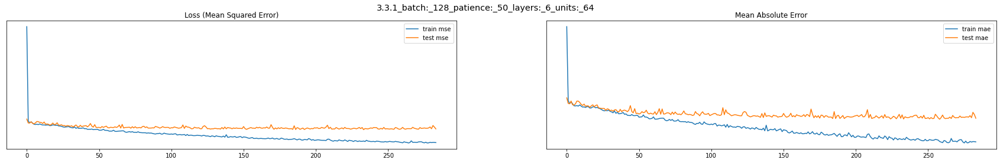

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_128_patience:_50_layers:_6...               6.223   
1  test:_3.3.1_batch:_128_patience:_50_layers:_6_...              14.330   
2  3.3.1_batch:_128_patience:_50_layers:_6_units:_64               8.106   

   mean_absolute_error  r2_score  e_v_score  
0                1.775    97.857     97.882  
1                2.711    95.112     95.134  
2                0.936     2.745      2.748  

Epoch 1: val_loss improved from inf to 0.03480, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.03480 to 0.02363, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_256_patience:_50_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.02363 to 0.02302, saving model to /content/drive/MyD

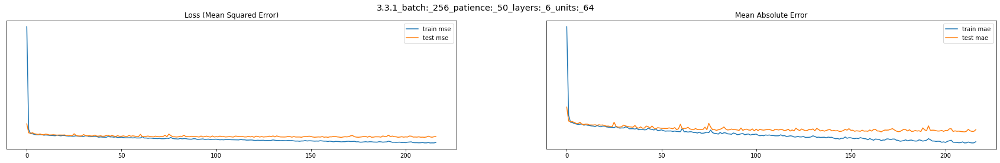

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_256_patience:_50_layers:_6...               9.468   
1  test:_3.3.1_batch:_256_patience:_50_layers:_6_...              15.256   
2  3.3.1_batch:_256_patience:_50_layers:_6_units:_64               5.788   

   mean_absolute_error  r2_score  e_v_score  
0                2.277    96.740     97.003  
1                2.894    94.796     95.035  
2                0.616     1.944      1.968  

Epoch 1: val_loss improved from inf to 0.08950, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_64.hdf5

Epoch 2: val_loss improved from 0.08950 to 0.03650, saving model to /content/drive/MyDrive/Colab Notebooks/4.ML_ANN_Project/weights_and_models/resnet-weights_3.3.1_batch:_512_patience:_50_layers:_6_units:_64.hdf5

Epoch 3: val_loss improved from 0.03650 to 0.02541, saving model to /content/drive/MyD

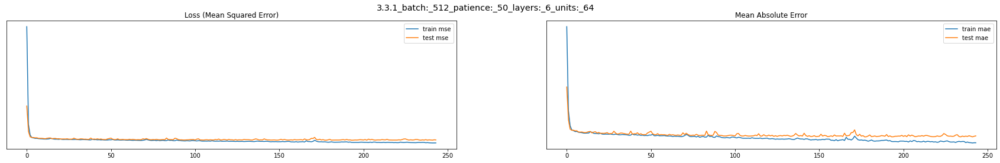

                                                type  mean_squared_error  \
0  train:_3.3.1_batch:_512_patience:_50_layers:_6...              10.390   
1  test:_3.3.1_batch:_512_patience:_50_layers:_6_...              15.426   
2  3.3.1_batch:_512_patience:_50_layers:_6_units:_64               5.037   

   mean_absolute_error  r2_score  e_v_score  
0                2.392    96.423     96.632  
1                2.934    94.738     94.947  
2                0.542     1.685      1.685  


In [ ]:
patience_list = [20, 50]
units = [16,32, 64]
layers = [2,3,4,5,6]
batch_list = [64, 128, 256, 512]
rcpr_transformer = FunctionTransformer(lambda x: 1/x, validate = True)
yj_transformer = PowerTransformer(method = 'yeo-johnson', standardize = False)

pipe_complex = define_pipeline_complex(RobustScaler(),yj_transformer, rcpr_transformer, False, True)
X_train, X_test, y_train, y_test, pipe,  y_test_orig, y_train_orig = split_impute_scale_pipe (pp_dataset, pipe_complex, KNNImputer(n_neighbors=2), True, True)
for p in patience_list:
  for lr in layers:
    for u in units:
      for b in batch_list:
        complete_run(f"3.3.1_batch:_{b}_patience:_{p}_layers:_{lr}_units:_{u}",pipe,pat =  p,  n_layers = lr, unt = u, batch = b)  

In [ ]:
show_results(isGraph = False)

,modelName,train_mse,test_mse,difference
117,3.3.1_batch:_128_patience:_50_layers:_6_units:_64,6.223,14.330,8.106
80,3.3.1_batch:_64_patience:_50_layers:_3_units:_64,8.480,14.418,5.939
105,3.3.1_batch:_128_patience:_50_layers:_5_units:_64,6.081,14.463,8.382
32,3.3.1_batch:_64_patience:_20_layers:_4_units:_64,10.199,14.483,4.283
68,3.3.1_batch:_64_patience:_50_layers:_2_units:_64,8.221,14.544,6.323
95,3.3.1_batch:_512_patience:_50_layers:_4_units:_64,10.650,14.587,3.937
114,3.3.1_batch:_256_patience:_50_layers:_6_units:_32,11.061,14.626,3.565
28,3.3.1_batch:_64_patience:_20_layers:_4_units:_32,10.689,14.637,3.948
83,3.3.1_batch:_512_patience:_50_layers:_3_units:_64,9.863,14.691,4.829
44,3.3.1_batch:_64_patience:_20_layers:_5_units:_64,8.093,14.763,6.670


<Figure size 2880x1080 with 0 Axes>

In [ ]:
update_results(isFinal = True)
show_results(isGraph = False)

,modelName,train_mse,test_mse,difference
15,3.3.1_batch:_512_patience:_20_layers:_3_units:_64,12.015,14.776,2.761
16,3.3.1_batch:_256_patience:_20_layers:_4_units:_32,12.978,15.224,2.245
7,No3.1.1_Adam_layers:_2_units:_32,12.987,15.232,2.245
9,No3.1.1_Adam_layers:_6_units:_32,12.322,15.302,2.980
8,No3.1.1_Adam_layers:_6_units:_16,13.874,15.533,1.658
14,3.1.5_optimizer_rmsprop_layers:_4_units:_32,13.504,15.541,2.037
13,3.1.5_optimizer_rmsprop_layers:_4_units:_128,12.943,15.733,2.791
6,3.1.3_optimizer_sgd_layers:_10_units:_128,15.029,16.038,1.009
4,3.1.2_Adagrad_layers:_20_units:_128,14.601,16.052,1.450
3,3.1.2_Adagrad_layers:_15_units:_128,15.314,16.187,0.873


<Figure size 2880x1080 with 0 Axes>

Two models has shown optimal results where in one combination of batch size 512 and 64 units and in another combination of batch size 256 and 32 units has shown optimal results




# Results

model with combination:
  - learning rate 0.001
  - batch size 512
  - patience 20
  - 3 layers
  - units 64

and second model combination:
  - learning rate 0.0005
  - batch size 512
  - patience 50
  - 2 layers
  - units 64

  have shown optimal resluts